<a href="https://colab.research.google.com/github/ShaleBale/SeaIce/blob/main/sea_ice_original_with_edits.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
pip install rasterio

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.3/21.3 MB 47.8 MB/s eta 0:00:00


In [2]:
import rasterio

In [3]:
pip install descartes

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [4]:
import os
import time
import random
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from tqdm import tqdm, trange
import cv2

from skimage.io import imread, imshow, concatenate_images
from skimage.transform import resize
from skimage.morphology import label, binary_dilation, binary_erosion, reconstruction
from skimage.measure import regionprops, regionprops_table
from skimage import measure
from skimage.segmentation import watershed

from shapely.geometry import Polygon, LineString
from shapely.affinity import scale
from descartes import PolygonPatch

import scipy.ndimage as ndi
import scipy.interpolate

import tensorflow as tf

from tensorflow.keras.models import Model, load_model
from tensorflow.keras.layers import Input, BatchNormalization, Activation, Dense, Dropout
from tensorflow.keras.layers import Lambda, RepeatVector, Reshape
from tensorflow.keras.layers import Conv2D, Conv2DTranspose
from tensorflow.keras.layers import MaxPooling2D
from tensorflow.keras.layers import concatenate, add
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import load_img

from glob import glob

In [5]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


Using open cv - cv.imshow does not work in colab, must use google patch with cv2_imshow. We load the image with GDAL to maintain georeference capabilities.

In [6]:
img_path = '/content/gdrive/MyDrive/SeaIce/Exports/Final_p10_168/c168_SHIFT_p10_Clip.tif'
mask_path = '/content/gdrive/MyDrive/SeaIce/Exports/Binary_Raster/pond_raster_tiff.tif'

In [7]:
image = cv2.imread(img_path, cv2.IMREAD_LOAD_GDAL)
mask = cv2.imread(mask_path, cv2.IMREAD_LOAD_GDAL)

In [23]:
img = image[:, :, -3:]

In [13]:
from google.colab.patches import cv2_imshow


Open CV defaults to reading a BGR image, therefore the displayed image of our ice is defaulted to the first three channels (band 1, band 2, and band 3).

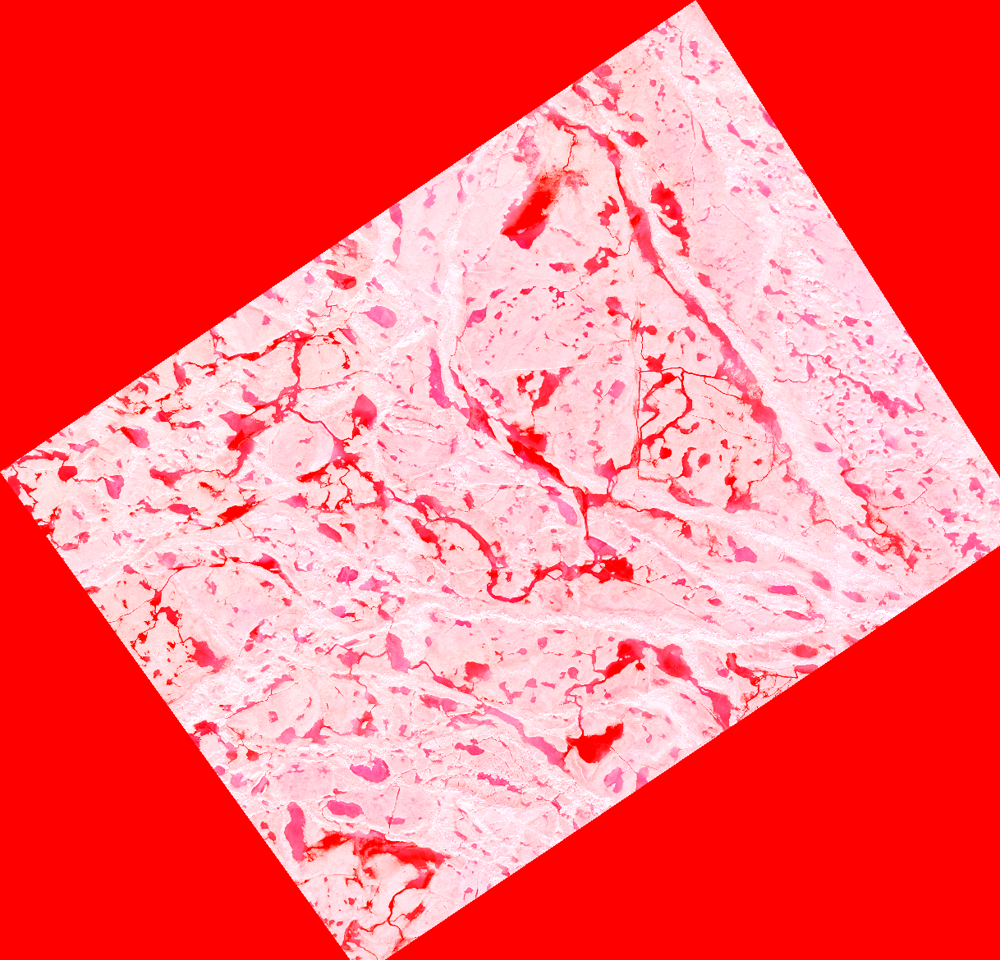

In [24]:
cv2_imshow(img)

We can see that our array shape includes 4 channels, where the fourth band represents the NIR.

In [12]:
img.shape

(1170, 1218, 3)

We now try to load the mask raster.

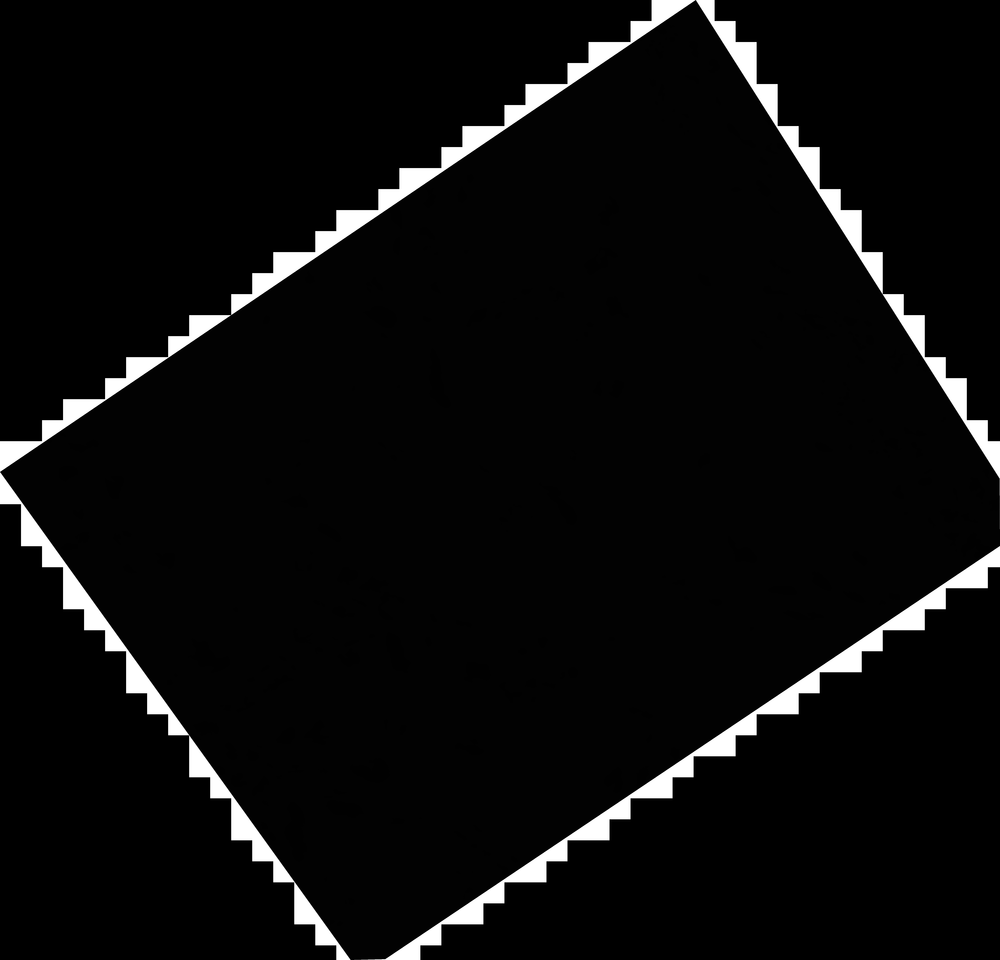

In [13]:
cv2_imshow(mask)

In [14]:
mask.shape

(5849, 6090)

In [15]:
img.shape

(1170, 1218, 3)

We see that the mask shape is much larger than the image shape. This is because the mask was originally generated on a full size tiff of the image, however, for modeling puposes we are using a p10 version of this image to conserve computational resources. The mask must be resized first to match our p10 image size.

In [16]:
mask_resize = cv2.resize(mask, None, fx=img.shape[0]/mask.shape[0], fy=img.shape[1]/mask.shape[1], interpolation = cv2.INTER_NEAREST)

In [17]:
mask_resize.shape

(1170, 1218)

In [18]:
img.shape

(1170, 1218, 3)

In [19]:
np.unique(mask_resize)

array([  0,   1,   2, 255], dtype=uint8)

We create a 3 channel grey mask in cv2 by setting all nodata values to 0, ice values to 100, and pond values to 255.

In [20]:
grey_mask = mask_resize.copy()
grey_mask[grey_mask == 255] = 0 #no data
grey_mask[grey_mask == 1] = 255 #ponds
grey_mask[grey_mask == 2] = 100 #ice

In [21]:
grey_3_channel_mask = cv2.cvtColor(grey_mask, cv2.COLOR_GRAY2BGR)

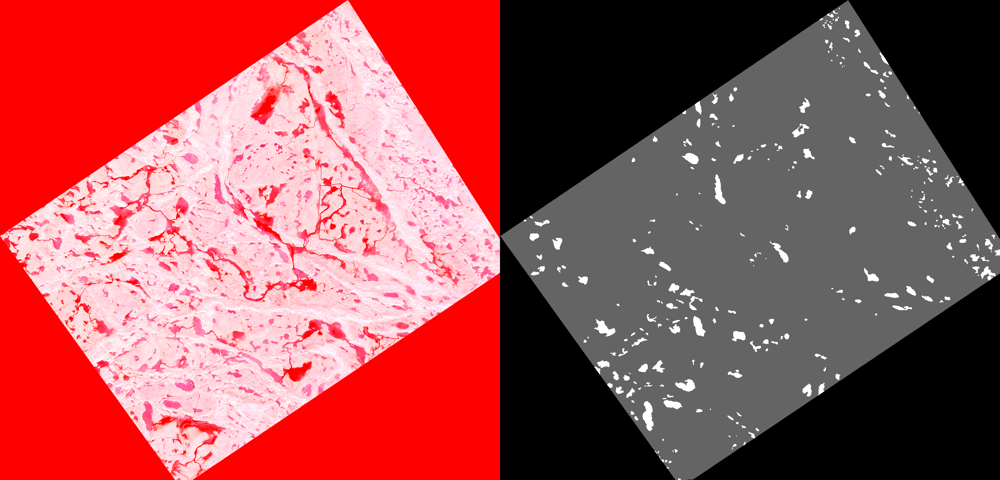

In [22]:
horizontal = np.hstack((img[:,:,0:3], grey_3_channel_mask))
cv2_imshow(horizontal)

In [23]:
def plot_images_and_labels(img, label):
  fig = plt.figure(figsize = (12, 4))
  
  ax1 = fig.add_subplot(131)
  ax1.imshow(img[:,:])
  ax1.set_title("Sea Ice")
  ax1.set_xticks([])
  ax1.set_yticks([])
  
  ax2 = fig.add_subplot(132)
  ax2.imshow(label[:,:])
  ax2.set_title("Label")
  ax2.set_xticks([])
  ax2.set_yticks([])
  
  dst = cv2.addWeighted(img, 0.5, label, 0.5, 0)
  
  ax3 = fig.add_subplot(133)
  ax3.imshow(dst[:,:])
  ax3.set_title("Blending")
  ax3.set_xticks([])
  ax3.set_yticks([])

We look to see how the blended image of the Sea Ice (using the first three channels) and the three-channel gray image blend.

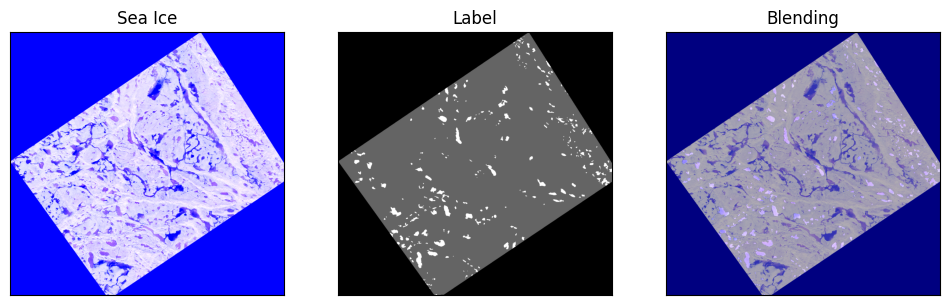

In [24]:
plot_images_and_labels(img, grey_3_channel_mask)

We only have one image and one mask, so to improve results we tile the image to generate more training data.

In [25]:
!mkdir Tiles

In [26]:
cd Tiles

/content/Tiles


In [27]:
!mkdir images
!mkdir labels

In [28]:
cd ..

/content


In [29]:
ls

gdrive/  sample_data/  Tiles/


In [30]:
# break up large images into small squares:
start_no = 0
im_size = 256

# if len(np.shape(img))==3:
#   image = img[:,:,0]
# if len(np.shape(grey_3_channel_mask))==3:
#   lab = grey_3_channel_mask[:,:,0]

r, c, z = np.shape(img)
n_rows = int(np.floor(r/float(im_size)))
n_cols = int(np.floor(c/float(im_size)))


# write files for segmented images:
for i in trange(n_rows):
    for j in range(n_cols):
        im = img[i*im_size:(i+1)*im_size, j*im_size:(j+1)*im_size, :].astype('uint8')
        imname = 'Tiles/images/' + 'im%03d.png'%(start_no+n_cols*i+j)
        m = grey_3_channel_mask[i*im_size:(i+1)*im_size, j*im_size:(j+1)*im_size].astype('uint8')
        labname = 'Tiles/labels/' + 'im%03d.png'%(start_no+n_cols*i+j)
        
        # if np.max(m)>0: # only save images that have more than just background
        im = Image.fromarray(im.astype(np.uint8))
        im.save(imname)
        m = Image.fromarray(m.astype(np.uint8))
        m.save(labname)

start_no = start_no + n_rows*n_cols

100%|██████████| 4/4 [00:00<00:00, 12.26it/s]


In [31]:
from glob import glob
images = sorted(glob("Tiles/images/*.png"))
labels = sorted(glob("Tiles/labels/*.png")) 

In [32]:
for i in range(len(images)):
  print('img_tile: {} | label_tile: {}'.format(images[i], labels[i]))

img_tile: Tiles/images/im000.png | label_tile: Tiles/labels/im000.png
img_tile: Tiles/images/im001.png | label_tile: Tiles/labels/im001.png
img_tile: Tiles/images/im002.png | label_tile: Tiles/labels/im002.png
img_tile: Tiles/images/im003.png | label_tile: Tiles/labels/im003.png
img_tile: Tiles/images/im004.png | label_tile: Tiles/labels/im004.png
img_tile: Tiles/images/im005.png | label_tile: Tiles/labels/im005.png
img_tile: Tiles/images/im006.png | label_tile: Tiles/labels/im006.png
img_tile: Tiles/images/im007.png | label_tile: Tiles/labels/im007.png
img_tile: Tiles/images/im008.png | label_tile: Tiles/labels/im008.png
img_tile: Tiles/images/im009.png | label_tile: Tiles/labels/im009.png
img_tile: Tiles/images/im010.png | label_tile: Tiles/labels/im010.png
img_tile: Tiles/images/im011.png | label_tile: Tiles/labels/im011.png
img_tile: Tiles/images/im012.png | label_tile: Tiles/labels/im012.png
img_tile: Tiles/images/im013.png | label_tile: Tiles/labels/im013.png
img_tile: Tiles/imag

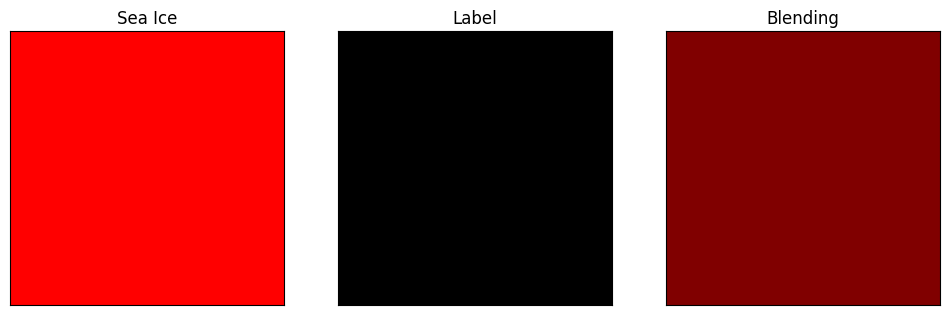

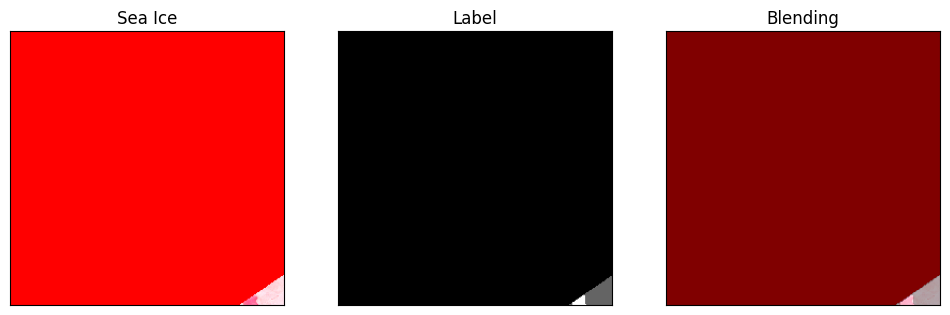

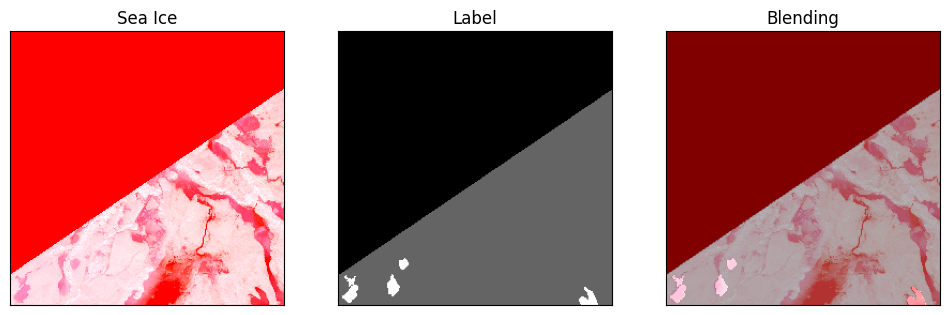

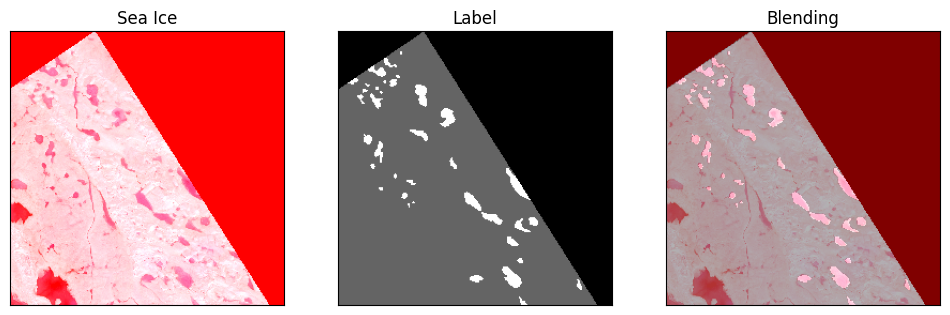

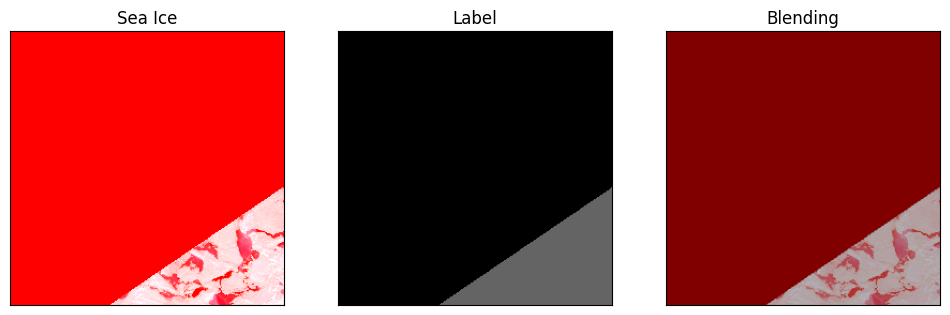

...

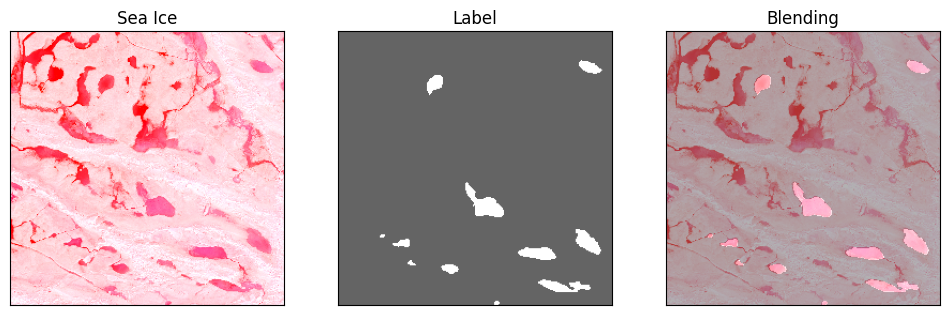

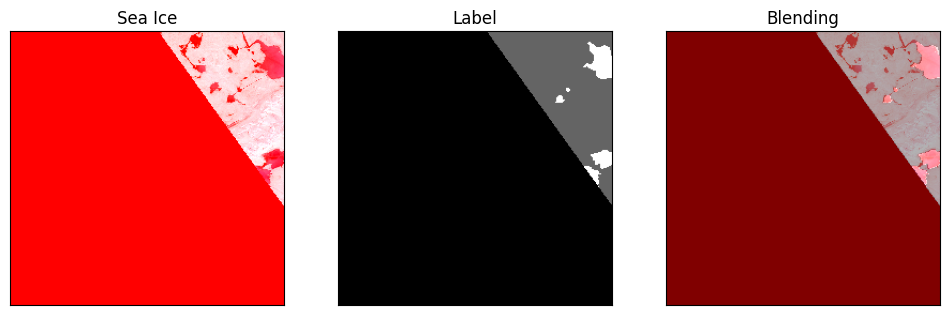

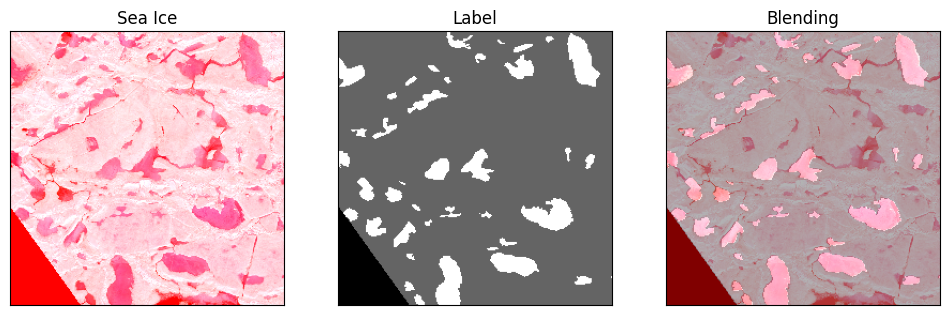

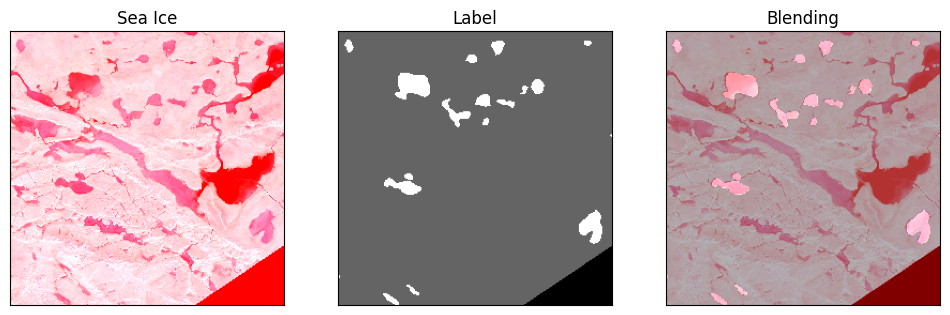

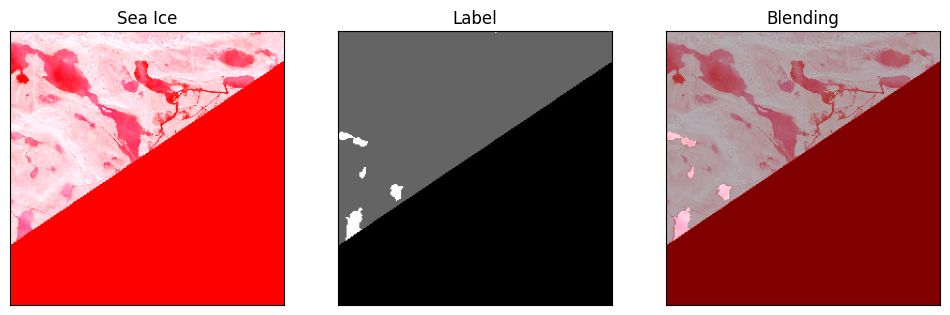

In [33]:
for i in range(len(images)):
  fname = images[i]
  tile = cv2.imread(fname)
  lab = cv2.imread(fname.replace('images', 'labels'))
  plot_images_and_labels(tile, lab)

We use image augmentation to enchance the number of training data we have.

In [34]:
!pip install clodsa

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.4/5.4 MB 92.3 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 276.2/276.2 kB 36.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for clodsa: filename=clodsa-1.2.48-py2.py3-none-any.whl size=74306 sha256=efb5bbef86883d9a924d6c86740e958e1fc9a70a4adce55e41804874d2f00f4d
  Stored in directory: /root/.cache/pip/wheels/57/64/44/4e5198b63c87ac87f1560d7a9625fa1ce34699de407bb2d41c
  Created wheel for commentjson: filename=commentjson-0.9.0-py3-none-any.whl size=12075 sha256=ebf3afd51ccb9ecbbf9acacff26a32eab4e3bbf3e80d4ed5bca094c236a13be8
  Stored in directory: /root/.cache/pip/wheels/7d/90/23/6358a234ca5b4ec0866d447079b97fedf9883387d1d7d074e5
  Created wheel for lark-parser: filename=lark_parser-0.7.8-py2.py3-none-any.whl size=625

In [35]:
pip install numpy --upgrade # this needs to be run twice for some reason??? Otherwise next cell won't work.

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 17.3/17.3 MB 66.2 MB/s eta 0:00:00
  Attempting uninstall: numpy
    Found existing installation: numpy 1.22.4
    Uninstalling numpy-1.22.4:
      Successfully uninstalled numpy-1.22.4
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
numba 0.56.4 requires numpy<1.24,>=1.18, but you have numpy 1.24.3 which is incompatible.
tensorflow 2.12.0 requires numpy<1.24,>=1.22, but you have numpy 1.24.3 which is incompatible.


In [36]:
from clodsa.augmentors.augmentorFactory import createAugmentor
from clodsa.transformers.transformerFactory import transformerGenerator
from clodsa.techniques.techniqueFactory import createTechnique

RuntimeError: ignored

Could not import submodules (exact error was: numpy.core.multiarray failed to import).

There are many reasons for this error the most common one is that you have
either not built the packages or have built (using `python setup.py build`) or
installed them (using `python setup.py install`) and then proceeded to test
mahotas **without changing the current directory**.

Try installing and then changing to another directory before importing mahotas.


In [37]:
PROBLEM = "semantic_segmentation"
ANNOTATION_MODE = "folders"
INPUT_PATH = "/content/Tiles/"
GENERATION_MODE = "linear" # all the augmentation techniques are applied to all the images of the original dataset
OUTPUT_MODE = "folders"
OUTPUT_PATH= "/content/augmented_images2/"
LABELS_EXTENSION = ".png"

augmentor = createAugmentor(PROBLEM, ANNOTATION_MODE, OUTPUT_MODE, GENERATION_MODE, INPUT_PATH,{"outputPath":OUTPUT_PATH,"labelsExtension":LABELS_EXTENSION})

In [38]:
transformer = transformerGenerator(PROBLEM) # initialize a transformer

In [39]:
# rotate images
rot90 = createTechnique("rotate", {"angle" : 90})
augmentor.addTransformer(transformer(rot90))
rot180 = createTechnique("rotate", {"angle" : 180})
augmentor.addTransformer(transformer(rot180))
rot270 = createTechnique("rotate", {"angle" : 270})
augmentor.addTransformer(transformer(rot270))

In [40]:
gamma = createTechnique("gamma",{"gamma":1.5})
augmentor.addTransformer(transformer(gamma))

In [41]:
gamma1 = createTechnique("gamma",{"gamma":2.0})
augmentor.addTransformer(transformer(gamma1))

In [42]:
gamma2 = createTechnique("gamma",{"gamma":0.5})
augmentor.addTransformer(transformer(gamma2))

In [43]:
none = createTechnique("none",{}) # need to copy the original images as well!
augmentor.addTransformer(transformer(none))

In [44]:
fliph = createTechnique("flip",{"flip":1})
flipv = createTechnique("flip",{"flip":0})
augmentor.addTransformer(transformer(fliph))
augmentor.addTransformer(transformer(flipv))

In [45]:
# equalize histo
equalize = createTechnique("equalize_histogram", {})
augmentor.addTransformer(transformer(equalize))

In [46]:
salt_and_pepper = createTechnique("salt_and_pepper",{"low":0, 'high': 255})
augmentor.addTransformer(transformer(salt_and_pepper))

In [47]:
median = createTechnique("median_blur",{"kernel":3})
augmentor.addTransformer(transformer(median))

In [48]:
dropout = createTechnique("dropout",{"percentage":0.05})
augmentor.addTransformer(transformer(gamma2))

In [49]:
invert = createTechnique("invert",{})
augmentor.addTransformer(transformer(invert))

In [50]:
len(augmentor.transformers)

14

In [51]:
augmentor.applyAugmentation() # apply the augmentation; this takes a while

In [52]:
images = sorted(glob("/content/augmented_images2/images/*.png"))
labels = sorted(glob("/content/augmented_images2/labels/*.png")) 

In [53]:
len(images)

224

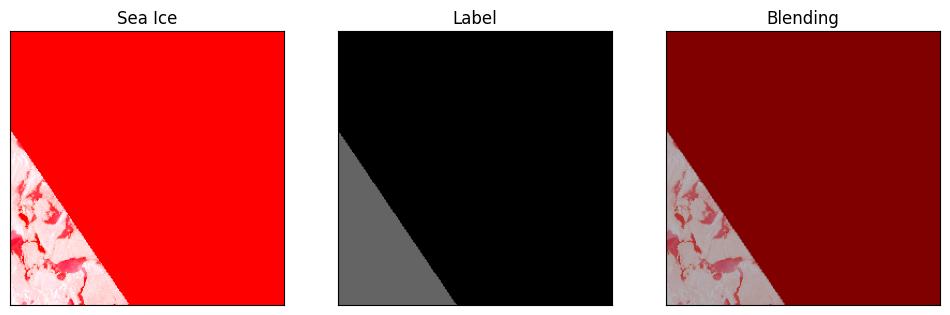

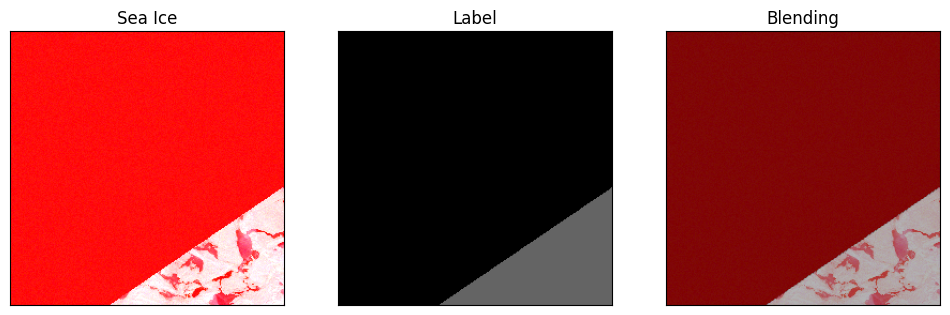

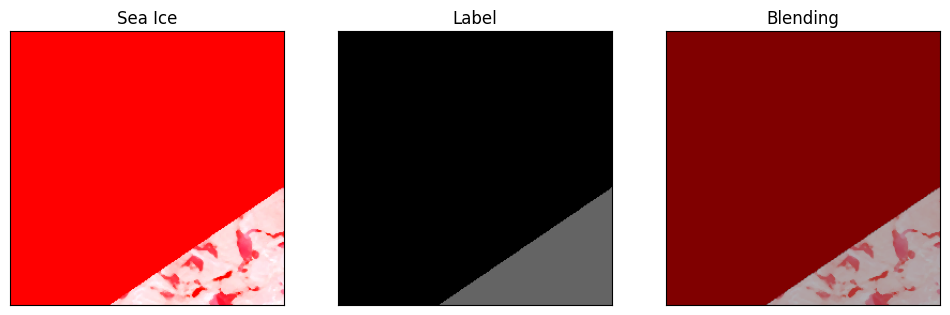

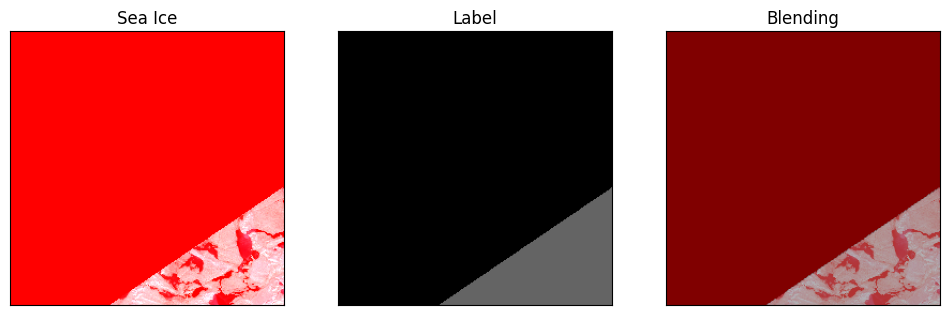

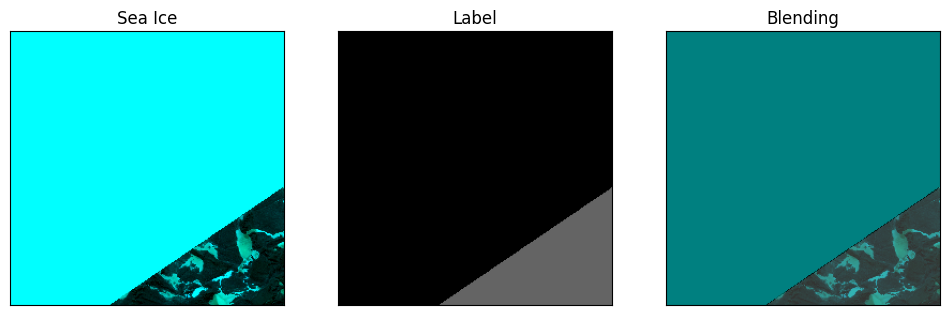

...

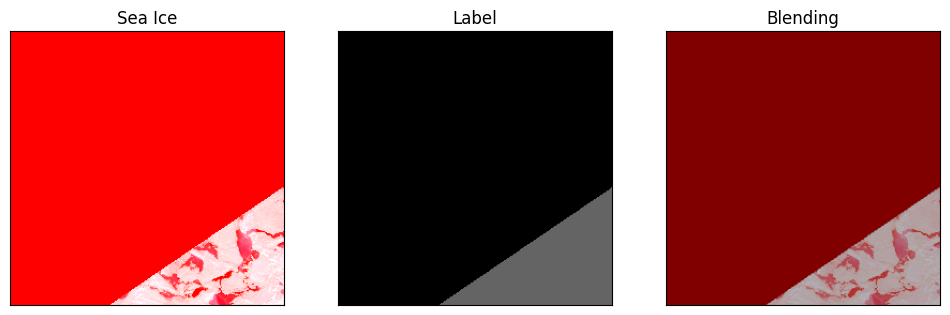

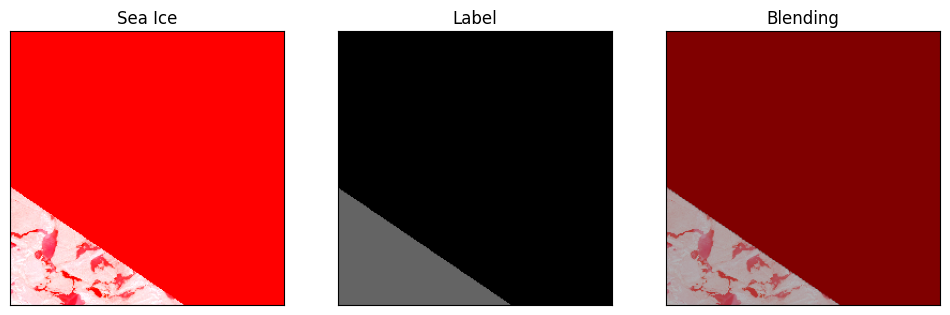

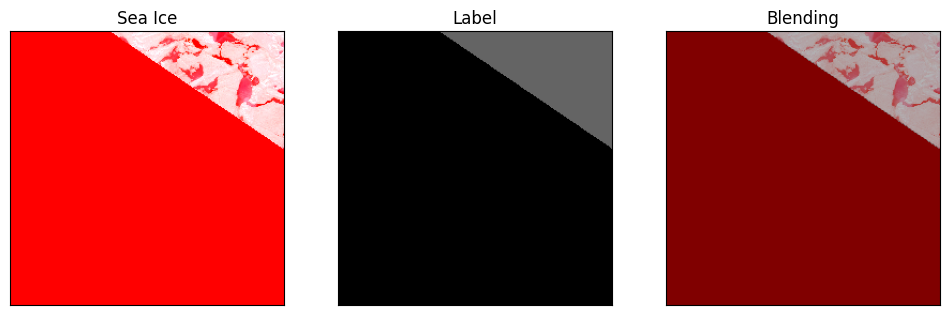

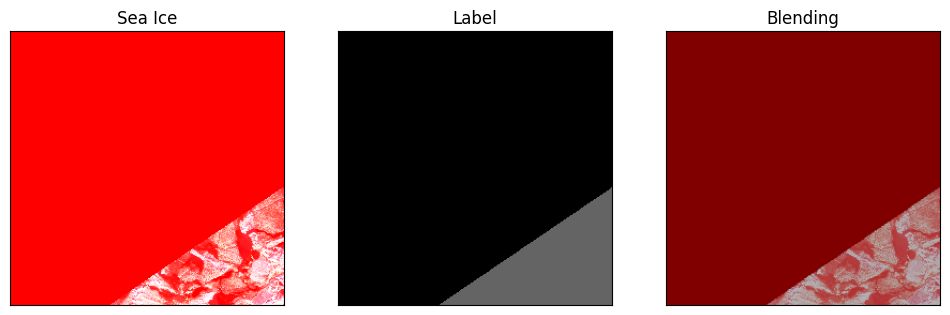

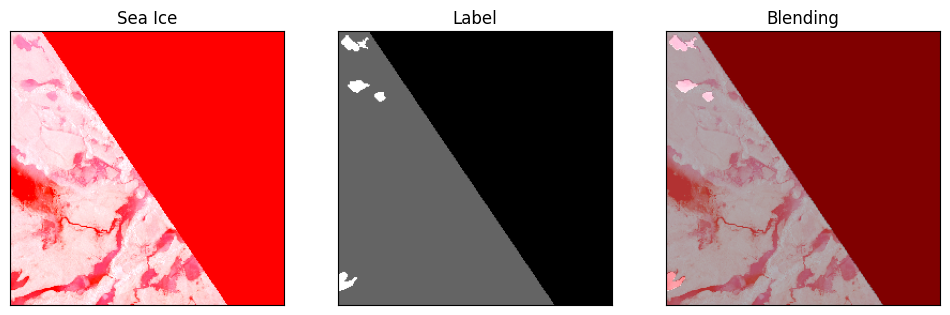

In [54]:
for i in range(15):
  fname = images[i]
  fname2 = labels[i]
  tile = cv2.imread(fname)
  lab = cv2.imread(fname2)
  plot_images_and_labels(tile, lab)

Now we start working on the model.

In [55]:
############### change this ratio
# split 70% into training
train_idx = np.random.choice(np.arange(len(images)), size = int(len(images)*0.7) , replace=False)

# get the rest
idx = np.setdiff1d(np.arange(len(images)), train_idx)

# get val files (20% of total)
val_idx = np.random.choice(idx, size = int(len(images)*0.2) , replace=False)

# get test files (10% of total)
test_idx = np.setdiff1d(val_idx, train_idx)

In [56]:
def image_batch_generator(files, im_size, batch_size = 8):
  
  while True: # this is here because it will be called repeatedly by the training function
    
    # extract a random subset of files of length "batch_size"
    batch = np.random.choice(files, size = batch_size)    
    
    # variables for collecting batches of inputs (x) and outputs (y)
    batch_x = []
    batch_y = []
    
    #cycle through each image in the batch
    for f in batch:
        # open the image and resize
        image = cv2.imread(f) #replaced pillow Image with cv2
        image = image[:,:,:]/255.0 # scale input image to (0, 1)
        # image = np.expand_dims(image,2)
        batch_x.append(image) 

        # open label image by string substitution
        mask = cv2.imread(f.replace('/images/','/labels/')) #replaced pillow Image with cv2
        mask = mask[:,:,0]
        temp = np.zeros((im_size, im_size, 3)) # create expanded target with channels for 3 classes
        temp[:,:,0][mask==0] = 1 # no data
        temp[:,:,1][mask==100] = 1 # ice
        temp[:,:,2][mask==255] = 1 # pond
        mask = temp
        batch_y.append(mask)

    # turn into numpy arrays
    batch_x = np.array(batch_x) 
    batch_y = np.array(batch_y)

    yield (batch_x, batch_y) #yield both the image and the label together

In [57]:
gen = image_batch_generator(images, im_size = 256, batch_size = 8)

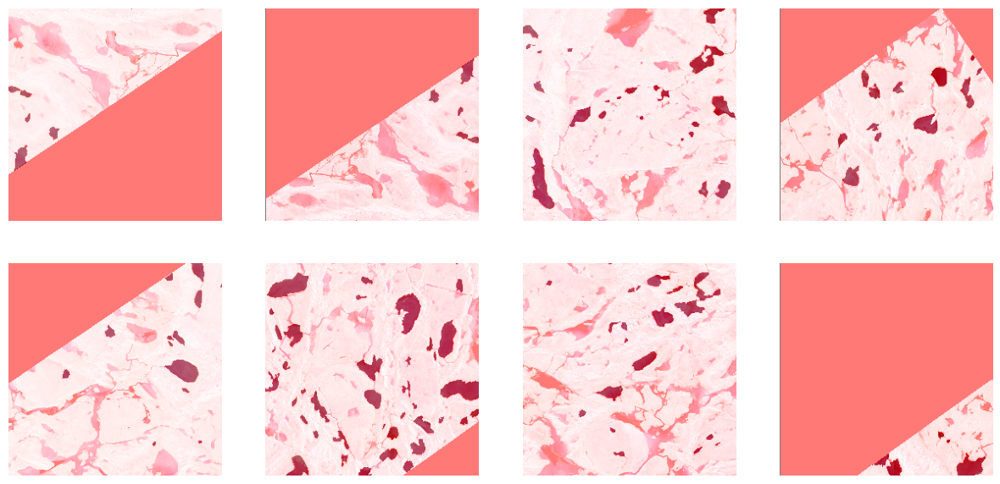

In [58]:
x1, y1 = next(gen)

plt.figure(figsize=(15,15))

counter = 0
for k in range(8):
  plt.subplot(4,4,counter+1)
  plt.imshow(x1[counter])
  plt.imshow(y1[counter][:,:,2], alpha=0.5, cmap=plt.cm.Reds) #adjusted to 2 index to highlight ponds
  plt.axis('off')
  counter += 1

In [59]:
np.shape(x1[0]) # image

(256, 256, 3)

In [60]:
np.shape(y1[0]) # label

(256, 256, 3)

In [61]:
# create arrays of training, validation, and test files (these are filenames)
train_files = np.array(images)[train_idx]
val_files = np.array(images)[val_idx]
test_files = np.array(images)[test_idx]

In [62]:
train_files[:5]

array(['/content/augmented_images2/images/5_4_im001.png',
       '/content/augmented_images2/images/9_0_im014.png',
       '/content/augmented_images2/images/6_12_im008.png',
       '/content/augmented_images2/images/8_10_im005.png',
       '/content/augmented_images2/images/11_4_im000.png'], dtype='<U49')

In [63]:
train_test = plt.imread(train_files[0])
train_test.shape

(256, 256, 3)

In [64]:
val_test = plt.imread(val_files[0])
val_test.shape

(256, 256, 3)

In [65]:
im_size = 256
batch_size = 8

train_generator = image_batch_generator(train_files, im_size, batch_size = batch_size) # call the batch generator for train set
val_generator  = image_batch_generator(val_files, im_size, batch_size = batch_size) # call batch generator validation set

train_steps = len(train_files)//batch_size # number of steps per training epoch
val_steps = len(val_files)//batch_size # number of steps per validation epoch

print(train_steps)
print(val_steps)

19
5


In [66]:
np.unique(y1[2][:,:,1])

array([0., 1.])

In [67]:
y1.shape

(8, 256, 256, 3)

Text(0.5, 1.0, 'Nodata/Background Layer')

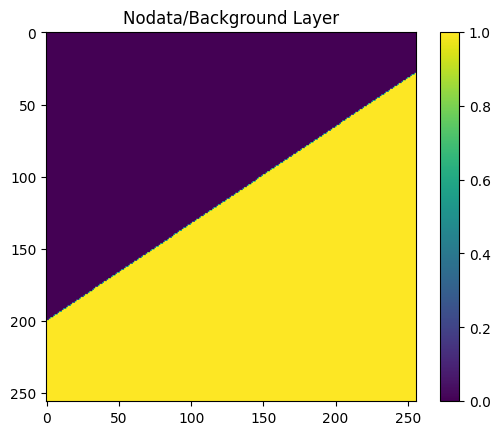

In [68]:
plt.imshow(y1[0, :, :, 0])
plt.colorbar()
plt.title('Nodata/Background Layer')

Text(0.5, 1.0, 'Nonpond Layer')

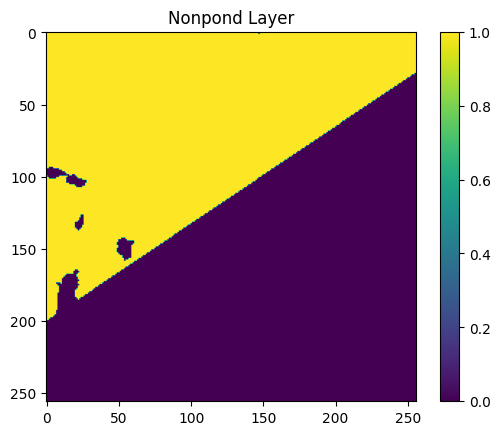

In [69]:
plt.imshow(y1[0, :, :, 1])
plt.colorbar()
plt.title('Nonpond Layer')

Text(0.5, 1.0, 'Pond Layer')

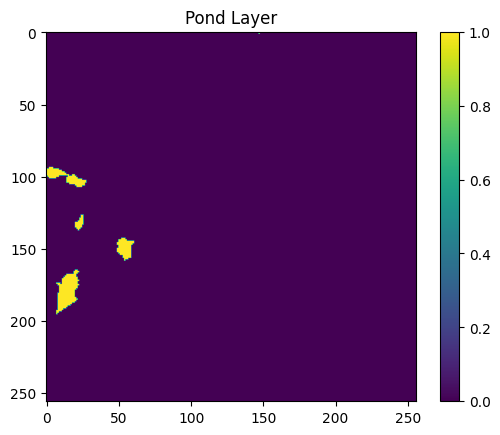

In [70]:
plt.imshow(y1[0, :, :, 2])
plt.colorbar()
plt.title('Pond Layer')

In [71]:
# get an idea about class balance
nodata_fractions = []
pond_fractions = []
nonpond_fractions = []

count = 0

while count < 100:
  x1, y1 = next(gen)
  
  for i in range(8):
    
    nonpond_fraction = len(np.where(y1[i][:,:,1]==1)[0])/(256**2)
    nonpond_fractions.append(nonpond_fraction)

    pond_fraction = len(np.where(y1[i][:,:,2]==1)[0])/(256**2)
    pond_fractions.append(pond_fraction)

    nodata_fractions.append(1 - pond_fraction - nonpond_fraction)
  
  count += 1 

In [72]:
print(1/(3*np.mean(nodata_fractions)), 1/(3*np.mean(nonpond_fractions)),  1/(3*np.mean(pond_fractions)))
# background, pond, non-pond

0.8976956739272782 0.5527377024985844 13.010609237024331


In [73]:
unique, counts = np.unique(grey_mask, return_counts=True)
print('unique: {} | counts: {}'.format(unique, counts))

print('% nodata = {}'.format(100*counts[0]/sum(counts)))
print('% nonpond = {}'.format(100*counts[1]/sum(counts)))
print('% pond = {}'.format(100*counts[2]/sum(counts)))

unique: [  0 100 255] | counts: [668414 723568  33078]
% nodata = 46.904270697374145
% nonpond = 50.77456387801215
% pond = 2.3211654246137003


In [74]:
#### Calculating weights a different way
import sklearn as sk
from sklearn.utils import class_weight

In [75]:
class_weights = sk.utils.class_weight.compute_class_weight('balanced', classes = np.unique(grey_mask), y = np.ravel(grey_mask))
class_weights

array([ 0.71066734,  0.65649669, 14.36060221])

In [76]:
def weighted_crossentropy(y_true, y_pred):
    class_weights = tf.constant([[[0.71066734,  0.65649669, 14.36060221]]]) #### this order needs to match y1 label layers index
    unweighted_losses = tf.nn.softmax_cross_entropy_with_logits(labels=y_true, logits=y_pred)
    weights = tf.reduce_sum(class_weights * y_true, axis=-1) # sum of weights
    weighted_losses = weights * unweighted_losses # weighted losses
    loss = tf.reduce_mean(weighted_losses) # mean loss
    return loss

In [77]:
def Unet():
    tf.keras.backend.clear_session()

    image = tf.keras.Input((256,256,3),name='input') #changed to 3 to match rgb image input size

    conv1 = Conv2D(16, (3,3), activation='relu', padding = 'same')(image)
    conv1 = BatchNormalization()(conv1)

    pool1 = MaxPooling2D(pool_size=(2, 2))(conv1)
    conv2 = Conv2D(32, (3,3), activation='relu', padding = 'same')(pool1)
    conv2 = BatchNormalization()(conv2)

    pool2 = MaxPooling2D(pool_size=(2, 2))(conv2)
    conv3 = Conv2D(64, (3,3), activation='relu', padding = 'same')(pool2)
    conv3 = BatchNormalization()(conv3)

    pool3 = MaxPooling2D(pool_size=(2, 2))(conv3)
    conv4 = Conv2D(128, (3,3), activation='relu', padding = 'same')(pool3)
    conv4 = BatchNormalization()(conv4)

    pool4 = MaxPooling2D(pool_size=(2, 2))(conv4)
    conv5 = Conv2D(256, (3,3), activation='relu', padding = 'same')(pool4)
    conv5 = BatchNormalization()(conv5)

    up6 = Conv2DTranspose(128, (3, 3), strides = (2, 2), padding = 'same')(conv5)
    up6 = concatenate([up6, conv4])
    conv6 = Conv2D(128, (3,3), activation='relu', padding = 'same')(up6)
    conv6 = BatchNormalization()(conv6)

    up7 = Conv2DTranspose(64, (3, 3), strides = (2, 2), padding = 'same')(conv6)
    up7 = concatenate([up7, conv3])
    conv7 = Conv2D(64, (3,3), activation='relu', padding = 'same')(up7)
    conv7 = BatchNormalization()(conv7)

    up8 = Conv2DTranspose(32, (3, 3), strides = (2, 2), padding = 'same')(conv7)
    up8 = concatenate([up8, conv2])
    conv8 = Conv2D(32, (3,3), activation='relu', padding = 'same')(up8)
    conv8 = BatchNormalization()(conv8)

    up9 = Conv2DTranspose(16, (3, 3), strides = (2, 2), padding = 'same')(conv8)
    up9 = concatenate([up9, conv1])
    conv9 = Conv2D(16, (3,3), activation='relu', padding = 'same')(up9)
    conv9 = BatchNormalization()(conv9)

    conv10 = Conv2D(3, (1,1), activation='softmax')(conv9)
    model = Model(inputs=[image], outputs=[conv10])

    return model

In [78]:
model = Unet()
loss = weighted_crossentropy
model.compile(optimizer=Adam(), loss=loss, metrics=["accuracy"])

In [79]:
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input (InputLayer)             [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d (Conv2D)                (None, 256, 256, 16  448         ['input[0][0]']                  
                                )                                                                 
                                                                                                  
 batch_normalization (BatchNorm  (None, 256, 256, 16  64         ['conv2d[0][0]']                 
 alization)                     )                                                             

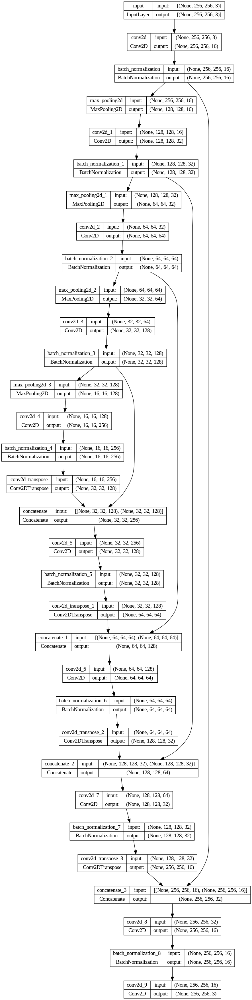

In [80]:
from keras.utils import plot_model
plot_model(model,show_shapes=True)

In [81]:
callbacks = [
    EarlyStopping(patience=5, verbose=1),
    ReduceLROnPlateau(factor=0.1, patience=5, min_lr=0.00001, verbose=1),
    ModelCheckpoint('model_1.h5', verbose=1, save_best_only=True, save_weights_only=True)
]

In [82]:
results = model.fit(train_generator, 
                epochs = 100, steps_per_epoch = train_steps,
                validation_data = val_generator, validation_steps = val_steps,
                callbacks = callbacks)	

Epoch 1/100
19/19 [==============================] - ETA: 0s - loss: 0.8280 - accuracy: 0.7671
Epoch 1: val_loss improved from inf to 1.05608, saving model to model_1.h5
19/19 [==============================] - 34s 98ms/step - loss: 0.8280 - accuracy: 0.7671 - val_loss: 1.0561 - val_accuracy: 0.7785 - lr: 0.0010
Epoch 2/100
19/19 [==============================] - ETA: 0s - loss: 0.7357 - accuracy: 0.8203
Epoch 2: val_loss did not improve from 1.05608
19/19 [==============================] - 1s 71ms/step - loss: 0.7357 - accuracy: 0.8203 - val_loss: 1.1103 - val_accuracy: 0.6532 - lr: 0.0010
Epoch 3/100
19/19 [==============================] - ETA: 0s - loss: 0.6784 - accuracy: 0.8779
Epoch 3: val_loss improved from 1.05608 to 1.02623, saving model to model_1.h5
19/19 [==============================] - 1s 75ms/step - loss: 0.6784 - accuracy: 0.8779 - val_loss: 1.0262 - val_accuracy: 0.6351 - lr: 0.0010
Epoch 4/100
19/19 [==============================] - ETA: 0s - loss: 0.6838 - accura

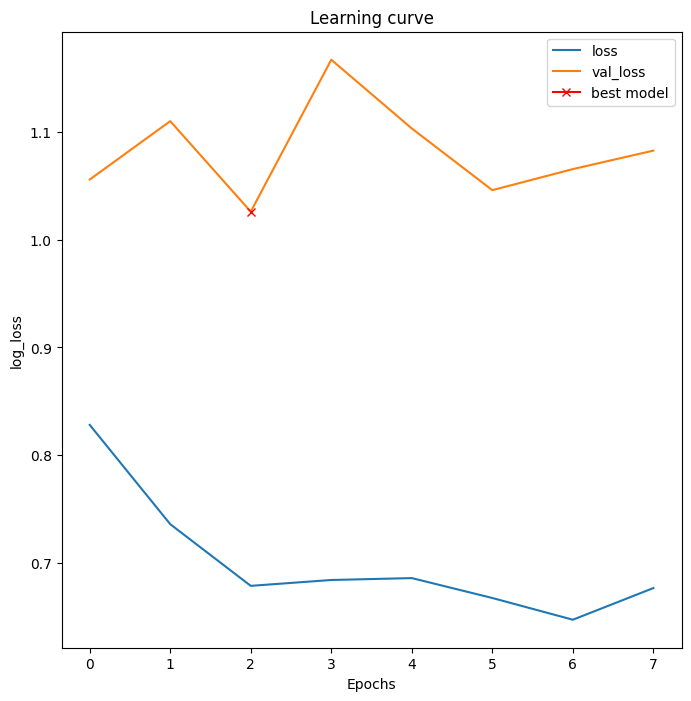

In [83]:
# with batch normalization
plt.figure(figsize=(8, 8))
plt.title("Learning curve")
plt.plot(results.history["loss"], label="loss")
plt.plot(results.history["val_loss"], label="val_loss")
plt.plot(np.argmin(results.history["val_loss"]), np.min(results.history["val_loss"]), marker="x", color="r", label="best model")
plt.xlabel("Epochs")
plt.ylabel("log_loss")
plt.legend();

In [84]:
# load the best model
model=Unet()
model.load_weights('model_1.h5')
loss = weighted_crossentropy
model.compile(optimizer=Adam(), loss=loss, metrics=["accuracy"])

In [85]:
test_generator = image_batch_generator(test_files, im_size, batch_size = batch_size)
print("# test files: %i" % (len(test_files)))
# some other training parameters
steps = len(test_files) // batch_size
# testing
scores = model.evaluate(test_generator, steps=steps) 

# test files: 44
5/5 [==============================] - 1s 59ms/step - loss: 0.9750 - accuracy: 0.5929


In [86]:
print(model.metrics_names)
print(scores)

['loss', 'accuracy']
[0.9750049710273743, 0.592947781085968]


We can see that our training accuracy is higher than our test and validation accuracies, indicating some possible overfitting. We can try to fix this by adding dropout layers in the Unet model.

In [87]:
def Unet_dropout():
    tf.keras.backend.clear_session()

    image = tf.keras.Input((256,256,3),name='input')

    conv1 = Conv2D(16, (3,3), activation='relu', padding = 'same')(image)
    conv1 = BatchNormalization()(conv1)

    pool1 = MaxPooling2D(pool_size=(2, 2))(conv1)
    pool1 = Dropout(0.25)(pool1) ### added dropout
    conv2 = Conv2D(32, (3,3), activation='relu', padding = 'same')(pool1)
    conv2 = BatchNormalization()(conv2)

    pool2 = MaxPooling2D(pool_size=(2, 2))(conv2)
    pool2 = Dropout(0.5)(pool2) ### added dropout
    conv3 = Conv2D(64, (3,3), activation='relu', padding = 'same')(pool2)
    conv3 = BatchNormalization()(conv3)

    pool3 = MaxPooling2D(pool_size=(2, 2))(conv3)
    pool3 = Dropout(0.5)(pool3) ### added dropout
    conv4 = Conv2D(128, (3,3), activation='relu', padding = 'same')(pool3)
    conv4 = BatchNormalization()(conv4)

    pool4 = MaxPooling2D(pool_size=(2, 2))(conv4)
    pool4 = Dropout(0.5)(pool4) ### added dropout
    conv5 = Conv2D(256, (3,3), activation='relu', padding = 'same')(pool4)
    conv5 = BatchNormalization()(conv5)

    up6 = Conv2DTranspose(128, (3, 3), strides = (2, 2), padding = 'same')(conv5)
    up6 = concatenate([up6, conv4])
    up6 = Dropout(0.5)(up6)
    conv6 = Conv2D(128, (3,3), activation='relu', padding = 'same')(up6)
    conv6 = BatchNormalization()(conv6)

    up7 = Conv2DTranspose(64, (3, 3), strides = (2, 2), padding = 'same')(conv6)
    up7 = concatenate([up7, conv3])
    up7 = Dropout(0.5)(up7)
    conv7 = Conv2D(64, (3,3), activation='relu', padding = 'same')(up7)
    conv7 = BatchNormalization()(conv7)

    up8 = Conv2DTranspose(32, (3, 3), strides = (2, 2), padding = 'same')(conv7)
    up8 = concatenate([up8, conv2])
    up8 = Dropout(0.5)(up8)
    conv8 = Conv2D(32, (3,3), activation='relu', padding = 'same')(up8)
    conv8 = BatchNormalization()(conv8)

    up9 = Conv2DTranspose(16, (3, 3), strides = (2, 2), padding = 'same')(conv8)
    up9 = concatenate([up9, conv1])
    up9 = Dropout(0.5)(up9)
    conv9 = Conv2D(16, (3,3), activation='relu', padding = 'same')(up9)
    conv9 = BatchNormalization()(conv9)

    conv10 = Conv2D(3, (1,1), activation='softmax')(conv9)
    model = Model(inputs=[image], outputs=[conv10])

    return model

In [88]:
model2 = Unet_dropout()
loss = weighted_crossentropy
model2.compile(optimizer=Adam(), loss=loss, metrics=["accuracy"])

In [89]:
model2.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input (InputLayer)             [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d (Conv2D)                (None, 256, 256, 16  448         ['input[0][0]']                  
                                )                                                                 
                                                                                                  
 batch_normalization (BatchNorm  (None, 256, 256, 16  64         ['conv2d[0][0]']                 
 alization)                     )                                                             

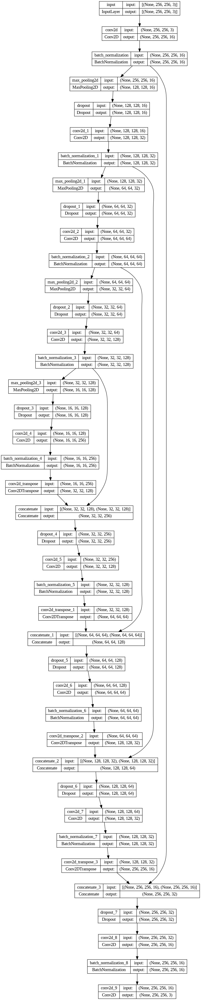

In [90]:
plot_model(model2,show_shapes=True)

In [91]:
callbacks = [
    EarlyStopping(patience=5, verbose=1),
    ReduceLROnPlateau(factor=0.1, patience=5, min_lr=0.00001, verbose=1),
    ModelCheckpoint('model_1.h5', verbose=1, save_best_only=True, save_weights_only=True)
]

In [92]:
results2 = model2.fit(train_generator, 
                epochs = 100, steps_per_epoch = train_steps,
                validation_data = val_generator, validation_steps = val_steps,
                callbacks = callbacks)	

Epoch 1/100
19/19 [==============================] - ETA: 0s - loss: 0.9989 - accuracy: 0.6509
Epoch 1: val_loss improved from inf to 1.09778, saving model to model_1.h5
19/19 [==============================] - 10s 126ms/step - loss: 0.9989 - accuracy: 0.6509 - val_loss: 1.0978 - val_accuracy: 0.5838 - lr: 0.0010
Epoch 2/100
19/19 [==============================] - ETA: 0s - loss: 0.7890 - accuracy: 0.8462
Epoch 2: val_loss improved from 1.09778 to 0.97752, saving model to model_1.h5
19/19 [==============================] - 2s 112ms/step - loss: 0.7890 - accuracy: 0.8462 - val_loss: 0.9775 - val_accuracy: 0.1693 - lr: 0.0010
Epoch 3/100
19/19 [==============================] - ETA: 0s - loss: 0.7414 - accuracy: 0.8744
Epoch 3: val_loss improved from 0.97752 to 0.92497, saving model to model_1.h5
19/19 [==============================] - 2s 127ms/step - loss: 0.7414 - accuracy: 0.8744 - val_loss: 0.9250 - val_accuracy: 0.9185 - lr: 0.0010
Epoch 4/100
19/19 [==============================

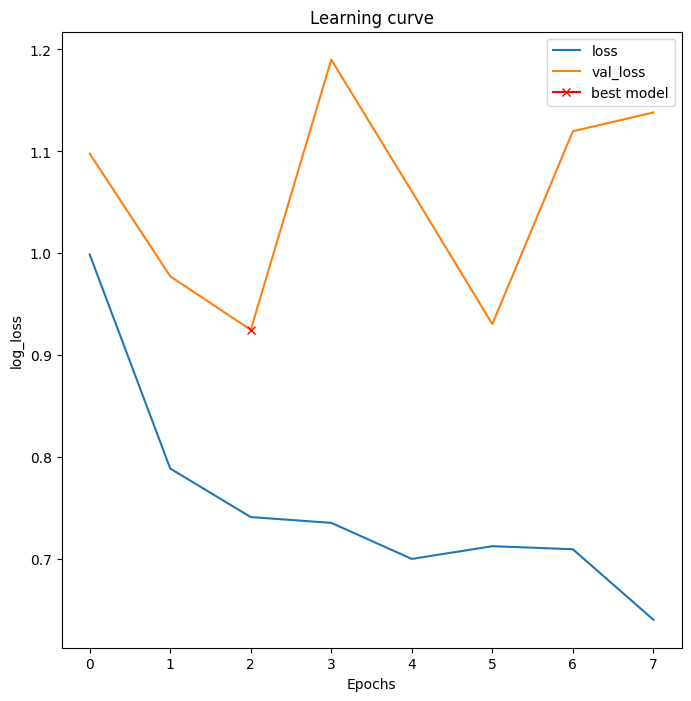

In [93]:
# with batch normalization and dropout
plt.figure(figsize=(8, 8))
plt.title("Learning curve")
plt.plot(results2.history["loss"], label="loss")
plt.plot(results2.history["val_loss"], label="val_loss")
plt.plot(np.argmin(results2.history["val_loss"]), np.min(results2.history["val_loss"]), marker="x", color="r", label="best model")
plt.xlabel("Epochs")
plt.ylabel("log_loss")
plt.legend();

In [94]:
# load the best model
model2=Unet()
model2.load_weights('model_1.h5')
loss = weighted_crossentropy
model2.compile(optimizer=Adam(), loss=loss, metrics=["accuracy"])

In [95]:
test_generator = image_batch_generator(test_files, im_size, batch_size = batch_size)
print("# test files: %i" % (len(test_files)))
# some other training parameters
steps = len(test_files) // batch_size
# testing
scores = model2.evaluate(test_generator, steps=steps) 

# test files: 44
5/5 [==============================] - 1s 61ms/step - loss: 0.8548 - accuracy: 0.9303


In [97]:
print(model2.metrics_names)
print(scores)

['loss', 'accuracy']
[0.8547824621200562, 0.930285632610321]


By adding dropout layers, we improved the overall model accuracy, however, our loss curve is still suspicious and indicates that the model is overfitting.

We can now plot the predicted labels against the image data. We start with a tile selection from the training data.

In [98]:
from skimage.measure import regionprops, regionprops_table
from skimage.morphology import binary_dilation, binary_erosion
from shapely.geometry import Polygon, LineString
from shapely.affinity import scale
from descartes import PolygonPatch
from skimage.morphology import reconstruction
import scipy.ndimage as ndi
from skimage import measure
from skimage.segmentation import watershed
from shapely.geometry import Polygon
import scipy.interpolate
import math
from matplotlib.colors import ListedColormap


#  functions for assembling big image from prediction tiles:
def predict_image_tile(im_tile, model):
    if len(np.shape(im_tile)) == 2:
      im_tile = np.expand_dims(im_tile, axis = 2) # add dimension for channel
    
    im_tile = np.expand_dims(im_tile, axis = 0) # add dimension for batch
    
    return model.predict(im_tile, verbose=0)[0]

def predict_big_image(big_im, model, I):
    pad_rows = I - np.mod(big_im.shape[0], I)
    pad_cols = I - np.mod(big_im.shape[1], I)
    
    if len(np.shape(big_im)) == 2:
      big_im = np.vstack((big_im, np.zeros((pad_rows, big_im.shape[1]))))
      big_im = np.hstack((big_im, np.zeros((big_im.shape[0], pad_cols))))
   
    if len(np.shape(big_im)) == 3:
      big_im = np.vstack((big_im, np.zeros((pad_rows, big_im.shape[1], big_im.shape[2]))))
      big_im = np.hstack((big_im, np.zeros((big_im.shape[0], pad_cols, big_im.shape[2]))))
    
    r = int(np.floor(big_im.shape[0]/I)) # number of rows of image tiles
    c = int(np.floor(big_im.shape[1]/I)) # number of columns of image tiles

    I2 = int(I/2)
    W = np.hanning(I) * np.hanning(I)[:, np.newaxis]
    Wup = W.copy()
    Wup[:I2, :] = np.tile(np.hanning(I), (I2, 1))
    Wdown = W.copy()
    Wdown[I2:, :] = np.tile(np.hanning(I), (I2, 1))

    if len(np.shape(big_im)) == 2:
      big_im = np.hstack((np.zeros((r*I, I2)), big_im, np.zeros((r*I, I2)))) # padding on the left and right sides
   
    if len(np.shape(big_im)) == 3:
      big_im = np.hstack((np.zeros((r*I, I2, 3)), big_im, np.zeros((r*I, I2, 3)))) # padding on the left and right sides
    
    big_im_pred = np.zeros((big_im.shape[0], big_im.shape[1], 3))

    for i in trange(c+1): # rows, no offset
      for j in range(1,2*r-2): # columns
        im_tile = big_im[j*I2:(j+2)*I2, i*I:(i+1)*I]/255.0
        im_tile_pred = predict_image_tile(im_tile, model)

        for layer in range(3):
          big_im_pred[j*I2:(j+2)*I2, i*I:(i+1)*I, layer] += im_tile_pred[:, :, layer] * W
    
    for i in range(c+1): # first row
      im_tile = big_im[:2*I2, i*I:(i+1)*I]/255.0
      im_tile_pred = predict_image_tile(im_tile, model)

      for layer in range(3):
        big_im_pred[:2*I2, i*I:(i+1)*I, layer] += im_tile_pred[:, :, layer] * Wup
    
    for i in range(c+1): # last row
      im_tile = big_im[(2*r-2)*I2:2*r*I2, i*I:(i+1)*I]/255.0
      im_tile_pred = predict_image_tile(im_tile,model)

      for layer in range(3):
        big_im_pred[(2*r-2)*I2:2*r*I2, i*I:(i+1)*I, layer] += im_tile_pred[:, :, layer] * Wdown

    for i in trange(c): # rows, half offset
      for j in range(1,2*r-2): # columns
        im_tile = big_im[j*I2:(j+2)*I2, i*I+I2:(i+1)*I+I2]/255.0
        im_tile_pred = predict_image_tile(im_tile,model)

        for layer in range(3):
          big_im_pred[j*I2:(j+2)*I2, i*I+I2:(i+1)*I+I2, layer] += im_tile_pred[:, :, layer] * W
    
    for i in range(c): # first row
      im_tile = big_im[:2*I2, i*I+I2:(i+1)*I+I2]/255.0
      im_tile_pred = predict_image_tile(im_tile,model)

      for layer in range(3):
        big_im_pred[:2*I2, i*I+I2:(i+1)*I+I2, layer] += im_tile_pred[:, :, layer] * Wup
    
    for i in range(c): # last row
      im_tile = big_im[(2*r-2)*I2:2*r*I2, i*I+I2:(i+1)*I+I2]/255.0
      im_tile_pred = predict_image_tile(im_tile,model)

      for layer in range(3):
        big_im_pred[(2*r-2)*I2:2*r*I2, i*I+I2:(i+1)*I+I2, layer] += im_tile_pred[:, :, layer] * Wdown

    big_im_pred = big_im_pred[:, I2:-I2, :] # crop the left and right side padding
    big_im_pred = big_im_pred[:-pad_rows, :-pad_cols, :] # get rid of padding
    
    return big_im_pred

In [99]:
from skimage.measure import regionprops, regionprops_table
from skimage.morphology import binary_dilation, binary_erosion
from shapely.geometry import Polygon, LineString
from shapely.affinity import scale
from descartes import PolygonPatch
from skimage.morphology import reconstruction
import scipy.ndimage as ndi
from skimage import measure
from skimage.segmentation import watershed
from shapely.geometry import Polygon
import scipy.interpolate
import math
from matplotlib.colors import ListedColormap


#  functions for assembling big image from prediction tiles:
def predict_image_tile(im_tile,model):
    if len(np.shape(big_im)) == 2:
      im_tile = np.expand_dims(im_tile, axis = 2) # add dimension for channel
    im_tile = np.expand_dims(im_tile, axis = 0) # add dimension for batch
    return model.predict(im_tile, verbose=0)[0]

def predict_big_image(big_im, model, I):
    pad_rows = I - np.mod(big_im.shape[0], I)
    pad_cols = I - np.mod(big_im.shape[1], I)
    if len(np.shape(big_im)) == 2:
      big_im = np.vstack((big_im, np.zeros((pad_rows, big_im.shape[1]))))
      big_im = np.hstack((big_im, np.zeros((big_im.shape[0], pad_cols))))
    if len(np.shape(big_im)) == 3:
      big_im = np.vstack((big_im, np.zeros((pad_rows, big_im.shape[1], big_im.shape[2]))))
      big_im = np.hstack((big_im, np.zeros((big_im.shape[0], pad_cols, big_im.shape[2]))))
    r = int(np.floor(big_im.shape[0]/I)) # number of rows of image tiles
    c = int(np.floor(big_im.shape[1]/I)) # number of columns of image tiles

    I2 = int(I/2)
    W = np.hanning(I) * np.hanning(I)[:, np.newaxis]
    Wup = W.copy()
    Wup[:I2, :] = np.tile(np.hanning(I), (I2, 1))
    Wdown = W.copy()
    Wdown[I2:, :] = np.tile(np.hanning(I), (I2, 1))

    if len(np.shape(big_im)) == 2:
      big_im = np.hstack((np.zeros((r*I, I2)), big_im, np.zeros((r*I, I2)))) # padding on the left and right sides
    if len(np.shape(big_im)) == 3:
      big_im = np.hstack((np.zeros((r*I, I2, 3)), big_im, np.zeros((r*I, I2, 3)))) # padding on the left and right sides
    big_im_pred = np.zeros((big_im.shape[0], big_im.shape[1], 3))

    for i in trange(c+1): # rows, no offset
      for j in range(1,2*r-2): # columns
        im_tile = big_im[j*I2:(j+2)*I2, i*I:(i+1)*I]/255.0
        im_tile_pred = predict_image_tile(im_tile, model)
        for layer in range(3):
          big_im_pred[j*I2:(j+2)*I2, i*I:(i+1)*I, layer] += im_tile_pred[:, :, layer] * W
    for i in range(c+1): # first row
      im_tile = big_im[:2*I2, i*I:(i+1)*I]/255.0
      im_tile_pred = predict_image_tile(im_tile, model)
      for layer in range(3):
        big_im_pred[:2*I2, i*I:(i+1)*I, layer] += im_tile_pred[:, :, layer] * Wup
    for i in range(c+1): # last row
      im_tile = big_im[(2*r-2)*I2:2*r*I2, i*I:(i+1)*I]/255.0
      im_tile_pred = predict_image_tile(im_tile,model)
      for layer in range(3):
        big_im_pred[(2*r-2)*I2:2*r*I2, i*I:(i+1)*I, layer] += im_tile_pred[:, :, layer] * Wdown

    for i in trange(c): # rows, half offset
      for j in range(1,2*r-2): # columns
        im_tile = big_im[j*I2:(j+2)*I2, i*I+I2:(i+1)*I+I2]/255.0
        im_tile_pred = predict_image_tile(im_tile,model)
        for layer in range(3):
          big_im_pred[j*I2:(j+2)*I2, i*I+I2:(i+1)*I+I2, layer] += im_tile_pred[:, :, layer] * W
    for i in range(c): # first row
      im_tile = big_im[:2*I2, i*I+I2:(i+1)*I+I2]/255.0
      im_tile_pred = predict_image_tile(im_tile,model)
      for layer in range(3):
        big_im_pred[:2*I2, i*I+I2:(i+1)*I+I2, layer] += im_tile_pred[:, :, layer] * Wup
    for i in range(c): # last row
      im_tile = big_im[(2*r-2)*I2:2*r*I2, i*I+I2:(i+1)*I+I2]/255.0
      im_tile_pred = predict_image_tile(im_tile,model)
      for layer in range(3):
        big_im_pred[(2*r-2)*I2:2*r*I2, i*I+I2:(i+1)*I+I2, layer] += im_tile_pred[:, :, layer] * Wdown

    big_im_pred = big_im_pred[:, I2:-I2, :] # crop the left and right side padding
    big_im_pred = big_im_pred[:-pad_rows, :-pad_cols, :] # get rid of padding
    return big_im_pred

def split_grains(im, selem_size):
    n_elems = 1
    eroded = im.copy()
    while (n_elems<2) & (1 in np.unique(eroded)):
        selem = np.ones((selem_size,selem_size))
        eroded = binary_erosion(eroded, selem = selem)
        temp_labels, n_elems = measure.label(eroded, return_num = True)
        obj_features = regionprops(temp_labels)
        for i in range(len(obj_features)):
            if obj_features[i]['area'] < 10:
                eroded[temp_labels==i+1] = 0
        temp_labels, n_elems = measure.label(eroded, return_num = True)
        selem_size += 1
    if np.max(eroded)>0:
        distance = ndi.distance_transform_edt(eroded)
        rs = []; cs = []
        # for i in range(n_elems+1):
        for i in range(n_elems):
            dist1 = distance.copy()
            dist1[temp_labels != i+1] = 0
            r, c = np.unravel_index(np.argmax(dist1), np.shape(im))
            rs.append(r)
            cs.append(c)
        markers = np.zeros(np.shape(im))
        # for i in range(n_elems+1):
        for i in range(n_elems):
            markers[rs[i],cs[i]] = i+1
        distance = ndi.distance_transform_edt(im)
        gr_labels = watershed(-distance, markers, mask=im)
    else:
        gr_labels = im.copy()
    return gr_labels, eroded

def split_all_grains(ind, object_features, filled, labels, selem_size):
    minrow, mincol, maxrow, maxcol = object_features[ind]["bbox"]
    im = filled[max(0,minrow-2):maxrow+2,max(0,mincol-2):maxcol+2].copy()
    im[labels[max(0,minrow-2):maxrow+2,max(0,mincol-2):maxcol+2] != ind+1] = 0
    if maxcol >= filled.shape[1]:
      im = np.hstack((im, np.zeros((im.shape[0],2))))
    result, eroded = split_grains(im, selem_size)
    im[result==2] = 2
    start = time.time()
    while np.max(result)>1:
      if len(result[result==2]) > len(result[result==1]):
        result[result==1] = 0
        result[result==2] = 1
      else:
        result[result==1] = 1
        result[result==2] = 0
      result, eroded = split_grains(result, selem_size)
      im[result==2] = np.max(im)+1
      if time.time() - start > 1.0: # There are objects where this loop gets stuck. We don't want that.
        break
    return im

def compute_curvature(x,y):
    """function for computing first derivatives and curvature of a curve (centerline)
    x,y are cartesian coodinates of the curve
    outputs:
    dx - first derivative of x coordinate
    dy - first derivative of y coordinate
    ds - distances between consecutive points along the curve
    s - cumulative distance along the curve
    curvature - curvature of the curve (in 1/units of x and y)"""
    dx = np.gradient(x) # first derivatives
    dy = np.gradient(y)      
    ddx = np.gradient(dx) # second derivatives 
    ddy = np.gradient(dy) 
    curvature = (dx*ddy-dy*ddx)/((dx**2+dy**2)**1.5)
    return curvature

def get_grain_axes(poly):
    if (type(poly) == Polygon) and (type(poly.minimum_rotated_rectangle) == Polygon):
        mbr_points = list(zip(*poly.minimum_rotated_rectangle.exterior.coords.xy))
        # calculate the length of each side of the minimum bounding rectangle
        mbr_lengths = [LineString((mbr_points[i], mbr_points[i+1])).length for i in range(len(mbr_points) - 1)]
        # get major/minor axis measurements
        minor_axis = min(mbr_lengths)
        major_axis = max(mbr_lengths)
        mrb = poly.minimum_rotated_rectangle
    else:
        minor_axis = np.nan
        major_axis = np.nan
        mrb = None
    return minor_axis, major_axis, mrb

def label_and_dilate_grains(big_im, big_im_pred, small_grain_threshold, dilate_size, selem_size, splitting):
    # separate objects through labeling image regions
    boundary = (big_im_pred[:,:,2] > 0.5).astype(np.uint8) # set this to 0.95 to minimize false positives
    boundary[big_im_pred[:,:,0] > 0.5] = 1 # set this to 0.05 to minimize false positives

    labels, n_labels = label(boundary, background=1, return_num=True) # object labeling
    object_features = regionprops(labels)
    object_areas = [objf["area"] for objf in object_features]
    # find the indices of small objects:
    small_obj_inds = np.where(np.array(object_areas)<small_grain_threshold)[0]+1
    count = 0
    for ind in tqdm(small_obj_inds):  # this can take a long time for a large image!
      labels[labels == ind] = 0
      count += 1

    # fill holes:
    labels[labels>0] = 1
    seed = np.copy(labels)
    seed[1:-1, 1:-1] = labels.max()
    filled = reconstruction(seed, labels, method='erosion')

    labels, n_labels = label(filled, return_num = True) # re-label image
    object_features = regionprops(labels)

    n_grains = n_labels
    new_labels = labels.copy() # new labels for split grain clusters
    if splitting == True:
        for ind in trange(n_labels):
            minrow, mincol, maxrow, maxcol = object_features[ind]["bbox"]
            im = filled[max(0,minrow-2):maxrow+2,max(0,mincol-2):maxcol+2].copy()
            im[labels[max(0,minrow-2):maxrow+2,max(0,mincol-2):maxcol+2] != ind+1] = 0
            if maxcol >= filled.shape[1]:
              im = np.hstack((im, np.zeros((im.shape[0],2))))

            im = split_all_grains(ind, object_features, filled, labels, selem_size)
            if np.max(im)>1:
              for i in range(2,int(np.max(im)+1)):
                if maxcol >= filled.shape[1]:
                  im = im[:,:-2]
                new_labels[max(0,minrow-2):maxrow+2,max(0,mincol-2):maxcol+2][im == i] = n_grains+1
                n_grains += 1

    object_features = regionprops(new_labels)

    new_labels_dilated = new_labels.copy()
    for ind in trange(len(object_features)):
      minrow, mincol, maxrow, maxcol = object_features[ind]["bbox"]
      pad = 10
      im = new_labels[max(0,minrow-pad):maxrow+pad,max(0,mincol-pad):maxcol+pad].copy()
      im[new_labels[max(0,minrow-pad):maxrow+pad,max(0,mincol-pad):maxcol+pad] != object_features[ind]["label"]] = 0
      im[im>0] = 1
      grain_dist = ndi.distance_transform_edt(1 - im)
      temp = np.ones(np.shape(im))
      temp[grain_dist > dilate_size] = 0
      im = temp
      im[im==1] = ind+1
      new_labels_dilated[max(0,minrow-pad):maxrow+pad,max(0,mincol-pad):maxcol+pad][im==ind+1] = im[im==ind+1]

    props = regionprops_table(new_labels_dilated, intensity_image = big_im, properties=('label', 'area', 'centroid', 'major_axis_length', 'minor_axis_length', 
                                                                                        'orientation', 'perimeter', 'max_intensity', 'mean_intensity', 'min_intensity'))
    grain_data = pd.DataFrame(props)

    print('plotting...')
    # create colormap with random colors, first color white (for background)
    colors = []
    for i in range(n_grains):
      l = list(np.random.random(3))
      l.append(1)
      colors.append(l)
    colors[0] = [1,1,1,0]
    cmap = ListedColormap(colors)

    xs, ys = create_grain_outlines(big_im, new_labels_dilated)

    fig = plt.figure(figsize=(30,20))
    plt.imshow(big_im, cmap='gray', interpolation=None)
    plt.imshow(new_labels_dilated, cmap=cmap, interpolation=None, alpha=0.4);
    for i in range(len(grain_data['label'])):
        # if type(xs[i]) == np.ndarray:
        plt.plot(xs[i], ys[i],'k', linewidth = 1.0)
    plt.xticks([])
    plt.yticks([])
    plt.xlim([0, np.shape(big_im)[1]])
    plt.ylim([np.shape(big_im)[0], 0])
    plt.tight_layout()
 
    return new_labels_dilated, grain_data, xs, ys

def create_grain_outlines(big_im, new_labels_dilated):
    object_features = regionprops(new_labels_dilated)
    filled = new_labels_dilated.copy()
    filled[filled>0] = 1
    n_grains = len(object_features)
    xs = []
    ys = []
    for ind in range(n_grains):
        minrow, mincol, maxrow, maxcol = object_features[ind]["bbox"]
        im = filled[max(0,minrow-2):maxrow+2,max(0,mincol-2):maxcol+2].copy()
        im[new_labels_dilated[max(0,minrow-2):maxrow+2,max(0,mincol-2):maxcol+2] != object_features[ind]["label"]] = 0
        if maxcol >= filled.shape[1]:
            im = np.hstack((im, np.zeros((im.shape[0],2))))
        contours = measure.find_contours(im, 0.5)
        sx = contours[0][:,1]
        sy = contours[0][:,0]
        xs.append(sx+mincol - 2 + 0.5)
        ys.append(sy+minrow - 2 + 0.5)
    return xs, ys

def compute_s_coordinates(x, y):
  dx = np.gradient(x) # first derivatives
  dy = np.gradient(y)   
  ds = np.sqrt(dx**2+dy**2)
  s = np.hstack((0,np.cumsum(ds[1:])))
  return s

def get_grain_curvature(big_im, labels, regions, ind):
  filled = labels.copy()
  filled[filled>0] = 1
  minrow, mincol, maxrow, maxcol = regions[ind].bbox
  im = filled[max(0,minrow-2):maxrow+2,max(0,mincol-2):maxcol+2].copy()
  im[labels[max(0,minrow-2):maxrow+2,max(0,mincol-2):maxcol+2] != regions[ind]["label"]] = 0
  if maxcol >= filled.shape[1]:
      im = np.hstack((im, np.zeros((im.shape[0],2))))
  contours = measure.find_contours(im, 0.5)
  x = contours[0][:,1] + mincol - 2 + 0.5
  y = contours[0][:,0] + minrow - 2 + 0.5
  s = compute_s_coordinates(x, y)
  deltas = 1.0
  tck, u = scipy.interpolate.splprep([x,y], s = 10, per = True) 
  unew = np.linspace(0,1,1+int(np.round(s[-1]/deltas))) # vector for resampling
  out = scipy.interpolate.splev(unew, tck) # resampling
  sx, sy = out[0], out[1]
  curv = compute_curvature(sx,sy)
  s = compute_s_coordinates(sx, sy)
  y0, x0 = regions[ind].centroid
  orientation = regions[ind].orientation
  x1 = x0 + math.cos(orientation) * 0.5 * regions[ind].minor_axis_length
  y1 = y0 - math.sin(orientation) * 0.5 * regions[ind].minor_axis_length
  x2 = x0 - math.sin(orientation) * 0.5 * regions[ind].major_axis_length
  y2 = y0 - math.cos(orientation) * 0.5 * regions[ind].major_axis_length
  fig = plt.figure()
  ax = fig.add_subplot(111)
  ax.imshow(big_im[max(0,minrow-10):maxrow+10, max(0,mincol-10):maxcol+10], cmap='gray', extent = [max(0,mincol-10), maxcol+10, maxrow+10, max(0,minrow-10)])
  ax.set_facecolor((0.6, 0.6, 0.6))
  # plt.scatter(sx, sy, s=60, c=curv, cmap='bwr_r', vmin = -0.1, vmax = 0.1)
  plt.plot(sx, sy, 'r', linewidth=2)
  ax.plot((x0, x1), (y0, y1), '-r', linewidth=1)
  ax.plot((x0, x2), (y0, y2), '-r', linewidth=1)
  ax.plot(x0, y0, '.g', markersize=15)
  plt.xticks([])
  plt.yticks([])
  plt.xlim(max(0,mincol-10), maxcol+10)
  plt.ylim(maxrow+10, max(0,minrow-10))
  # plt.colorbar();
  return curv, sx, sy

[]

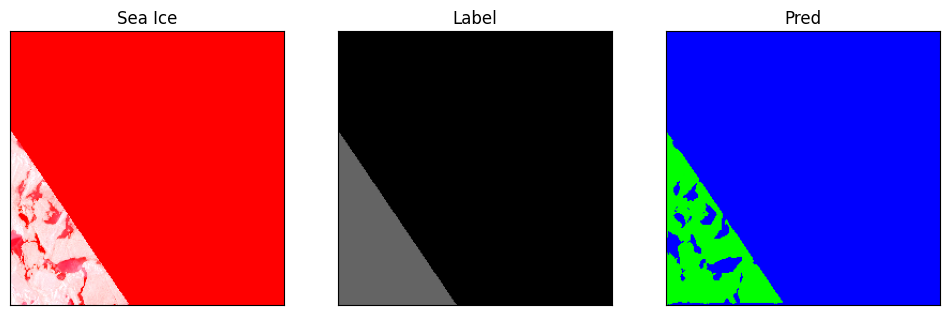

In [107]:
tile = cv2.imread(images[0])
lab = cv2.imread(labels[0])
pred = predict_image_tile(tile, model2)

fig = plt.figure(figsize = (12, 4))
  
ax1 = fig.add_subplot(131)
ax1.imshow(tile[:,:])
ax1.set_title("Sea Ice")
ax1.set_xticks([])
ax1.set_yticks([])

ax2 = fig.add_subplot(132)
ax2.imshow(lab[:,:])
ax2.set_title("Label")
ax2.set_xticks([])
ax2.set_yticks([])

ax3 = fig.add_subplot(133)
ax3.imshow(pred[:,:])
ax3.set_title("Pred")
ax3.set_xticks([])
ax3.set_yticks([])



We can see that the prediction fails to identify the ponds, and instead covers labels the entire ice sheet as "nonpond" (green color). To verify, we also plot the large image.

In [102]:
big_im = np.array(img)

In [103]:
big_im_pred = predict_big_image(big_im, model2, I=256)

100%|██████████| 5/5 [00:02<00:00,  2.22it/s]


In [109]:
uni_pred, count_pred = np.unique(big_im_pred, return_counts=True)
print(uni_pred, count_pred)

[0.02326596 0.02380243 0.02393574 ... 0.87300625 0.88136508 0.88278135] [1 1 1 ... 1 1 1]


Text(0.5, 1.0, 'Probability of pond label')

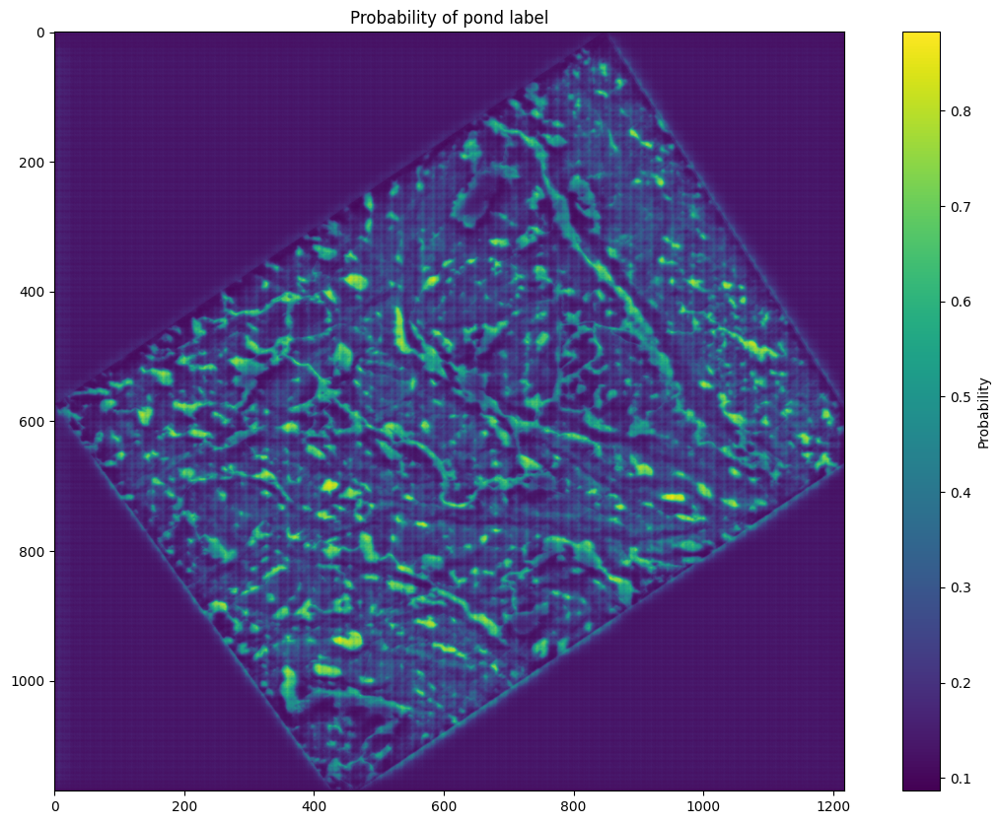

In [110]:
plt.figure(figsize=(15,10))
plt.imshow(big_im_pred[:, :, 2])
plt.colorbar(label='Probability')
plt.title('Probability of pond label')

Again, the model fails to predict ponds. This is a large indication that our model does not have enough pond data to accurately predict them from the other label classes and that our model is overfitted relative to the nonpond and nodata (background) labels. To improve this, more data for ponds would be necessary to improve the model training. 

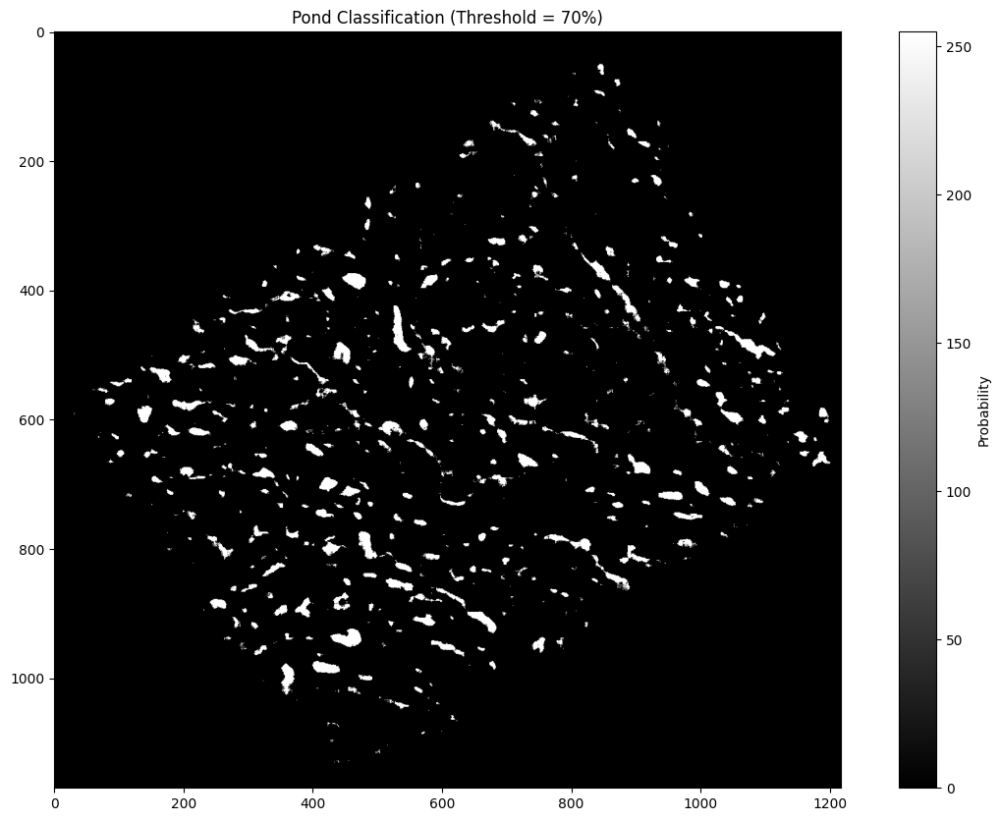

In [114]:
# Assuming big_im_pred is the probability image
pond_probability = big_im_pred[:, :, 2]

# Define the probability threshold
probability_threshold = 0.55

# Create a binary mask where True represents pixels with probability greater than the threshold
pond_mask = pond_probability > probability_threshold

# Create a binary image where 255 represents pond pixels and 0 represents non-pond pixels
pond_image = np.zeros_like(pond_mask, dtype=np.uint8)
pond_image[pond_mask] = 255

# Plot the pond image
plt.figure(figsize=(15, 10))
plt.imshow(pond_image, cmap='gray')
plt.colorbar(label='Probability')
plt.title('Pond Classification (Threshold = 70%)')
plt.show()

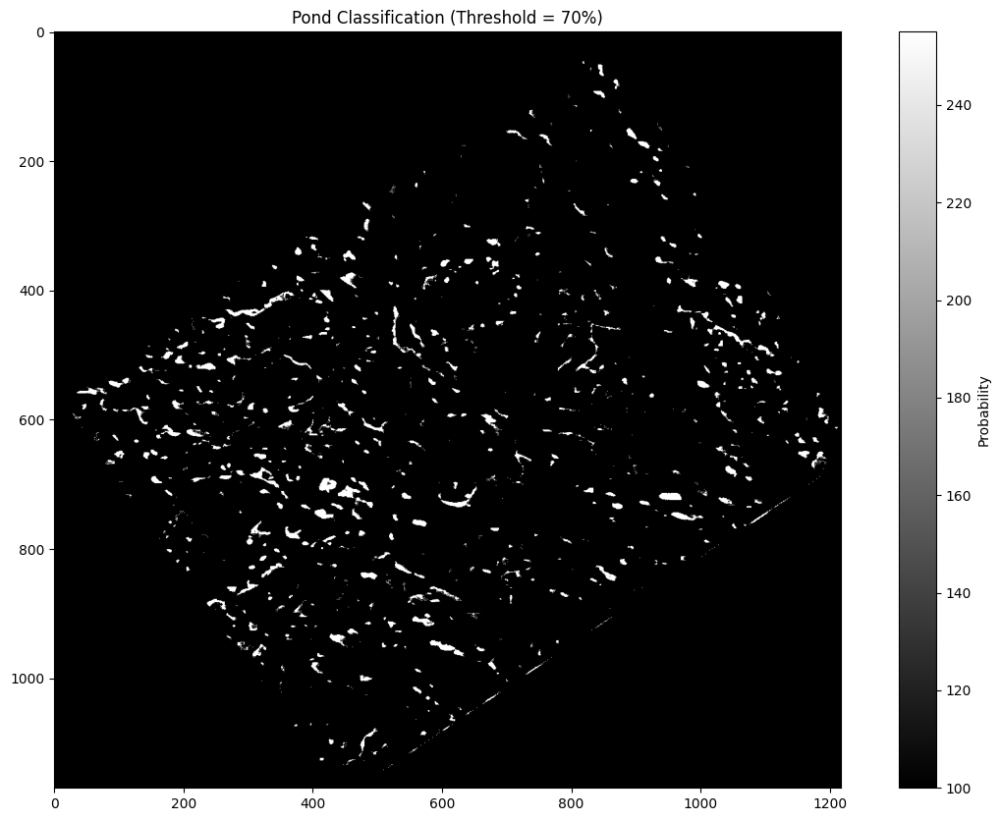

In [160]:
# Create a binary image where 255 represents pond pixels and 100 represents non-pond pixels
pond_image = np.zeros_like(pond_mask, dtype=np.uint8)
pond_image[pond_mask] = 255
pond_image[~pond_mask] = 100  # Set non-pond pixels to 100

# Plot the pond image
plt.figure(figsize=(15, 10))
plt.imshow(pond_image, cmap='gray')
plt.colorbar(label='Probability')
plt.title('Pond Classification (Threshold = 70%)')
plt.show()

In [ ]:
# Assuming img is the image with no data values
# Create a mask where True represents pixels with 0 values across all three bands
no_data_mask = np.all(img == 0, axis=2)

# Set the corresponding pixels in pond_image to 0
pond_image[no_data_mask] = 0
no_data_mask = np.expand_dims(no_data_mask, axis=2)
pond_image = np.where(no_data_mask[..., None], 0, pond_image)

array([False])

In [163]:
np.unique(pond_image)

array([100, 255], dtype=uint8)

In [142]:
pond_image.shape

(1170, 1218)

In [143]:
pond_image_3d = cv2.cvtColor(pond_image, cv2.COLOR_GRAY2BGR)

In [144]:
pond_image_3d.shape

(1170, 1218, 3)

  0%|          | 0/1 [00:00<?, ?it/s]<ipython-input-150-15e0c391e268>:91: FutureWarning: `selem` is a deprecated argument name for `binary_erosion`. It will be removed in version 1.0. Please use `footprint` instead.
  eroded = binary_erosion(eroded, selem = selem)
100%|██████████| 1/1 [00:00<00:00,  3.74it/s]


plotting...


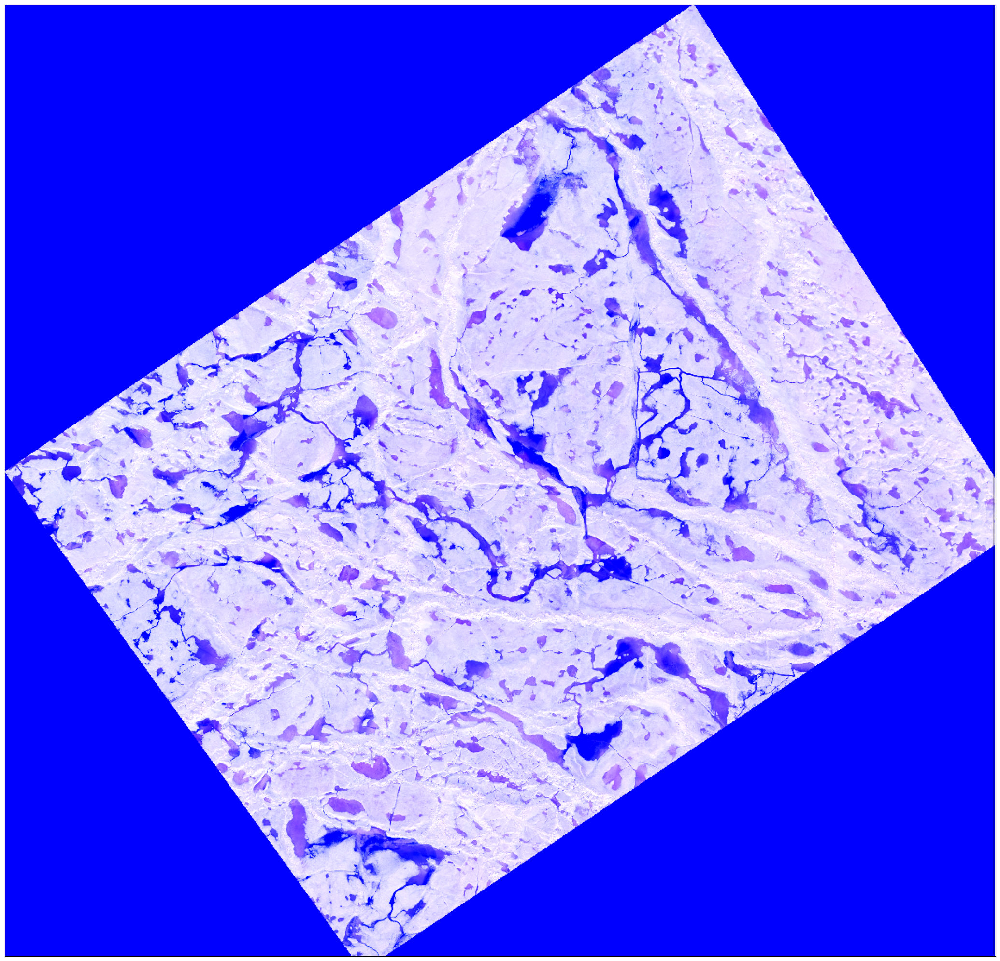

In [152]:
# post-processing
from skimage.morphology import label
small_grain_threshold = 25 # objects that have an area smaller than this (in pixels) will be deleted
selem_size = 1 # increasing this parameter reduces the tendency to split grains. It is worth trying out 
                # a few values to see what works best for the image
dilate_size = 4
splitting = True # you can turn grain splitting on or off. Usually it is better to set this to 'True'
labels, grain_data, xs, ys = label_and_dilate_grains(big_im, pond_image_3d, 
                                                small_grain_threshold, dilate_size, selem_size, splitting)

In [153]:
grain_data[:10]

,label,area,centroid-0,centroid-1,major_axis_length,minor_axis_length,orientation,perimeter,max_intensity-0,max_intensity-1,max_intensity-2,mean_intensity-0,mean_intensity-1,mean_intensity-2,min_intensity-0,min_intensity-1,min_intensity-2
0,1,1425060,584.5,608.5,1406.424782,1350.999136,1.570796,4772.0,255.0,255.0,255.0,108.077341,102.394016,255.0,0.0,0.0,255.0
